<h1>
    Foundations of Machine Learning - IT 582
</h1>

<h2>
    Assignment - 2 | Gradient Descent
</h2>
<br>

<h3>
    Name : Manish Manojkumar Prajapati
</h3>
<h3>
    Student-ID : 202411012
</h3>
<br>

<h3>
    Problem - 2 : Find minima of following functions using Gradient Descent method with learning rate 0.01 and 0.1 and different number of iterations. Try choosing a large value of learning rate and test convergence. For L<sub>5</sub>(&theta;), use the data file:
</h3>
<br>
<h3>
    ( a.) L<sub>1</sub>(&theta;) = &theta;<sup>2</sup>
</h3>
<br>

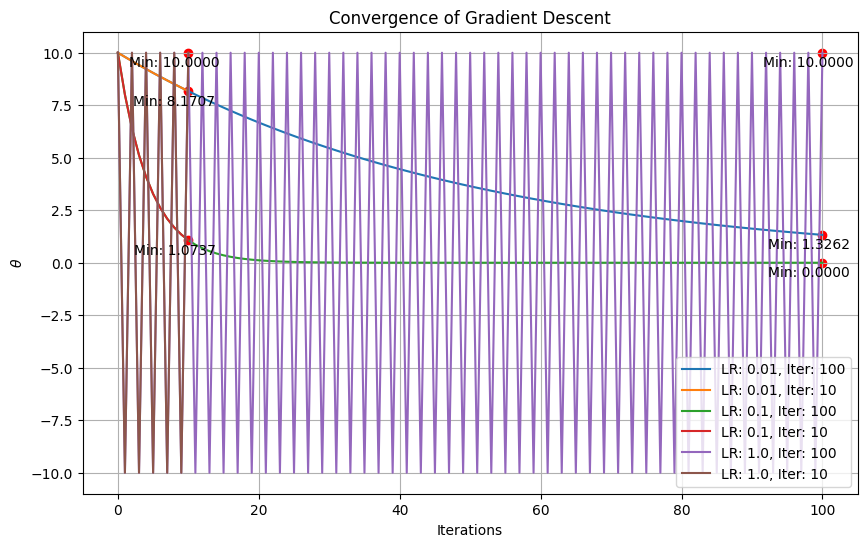

In [1]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati


# Problem 2
# Find the minima of the following functions using Gradient Descent Method with learning rate
# 0.01 and 0.1 and different number of iterations. Try choosing a large value of learning 
# rate and test the convergence. For L_5(theta), use the data file.

# a.) L1(theta) = theta^2

# Importing Libraries

import numpy as np
import matplotlib.pyplot as plt


# Function for calculating next theta values, i.e., gradient descent function

def gradient_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate*gradient
        theta_history.append(theta)

    return theta, theta_history



# Function for plotting graph

def plot_convergence(theta_history, learning_rate, num_iterations):
    plt.plot(theta_history, label=f"LR: {learning_rate}, Iter: {num_iterations}")
    plt.xlabel('Iterations')
    plt.ylabel(r'$\theta$')
    plt.title('Convergence of Gradient Descent')
    plt.legend()
    plt.grid(True)

    
    # Highlight the minimum value of theta
    
    final_theta = theta_history[-1]
    plt.scatter(len(theta_history) - 1, final_theta, color='red')  # Mark the final theta with a red dot
    plt.annotate(f"Min: {final_theta:.4f}", (len(theta_history) - 1, final_theta),
                 textcoords="offset points", xytext=(-10,-10), ha='center')


# Gradient of L(theta) = theta^2

def L1_grad(theta):
    return 2*theta


# Initializing theta value

theta_init = 10.0



# Different learning rates and iterations

learning_rates = [0.01, 0.1, 1.0]
iterations = [100, 10]


plt.figure(figsize=(10, 6))


for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = gradient_descent(L1_grad, theta_init, lr, iters)
        plot_convergence(theta_history, lr, iters)

plt.show()





<h4>
    Conclusion:
</h4>
<ul>
    <li>
        For &theta; = 0.1, and iterations = 10, the graph seems to be divergent from the graph with a smaller learn rate of 0.01
    </li>
    <li>
        As the number of iterations increases, the graph with learning rate of 0.1 seems getting stable with difference between newly calculated and previous theta value being negligible
    </li>
    <li>
        For &theta;=0.01, the number of iterations required will be still more than 1000, as the for 100 iterations, there's still some difference between newly calculated and previous &theta; value
    </li>
    <li>
        Gradient descent approach with a higher learning rate, i.e., with &theta;=1.0, the graph is bouncing to and fro, and don't seem converging
    </li>
    <li>
        <b>Minimum value of &theta;</b> obtained is 0.0 with its corresponding loss value being 0.0 too.
    </li>
</ul>

<br>
<h3>
    ( b.) L<sub>2</sub>(&theta;) = &theta;<sub>1</sub><sup>2</sup> + &theta;<sub>2</sub><sup>2</sup>
</h3>
<br>

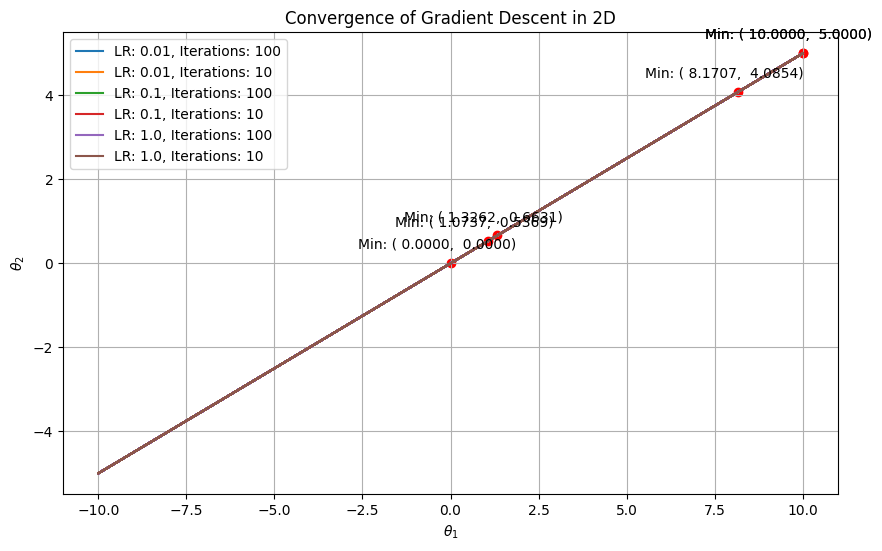

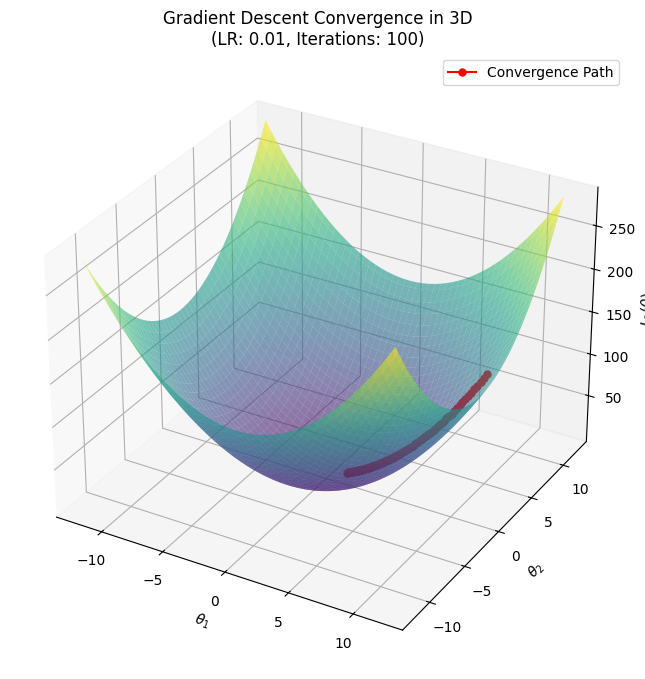

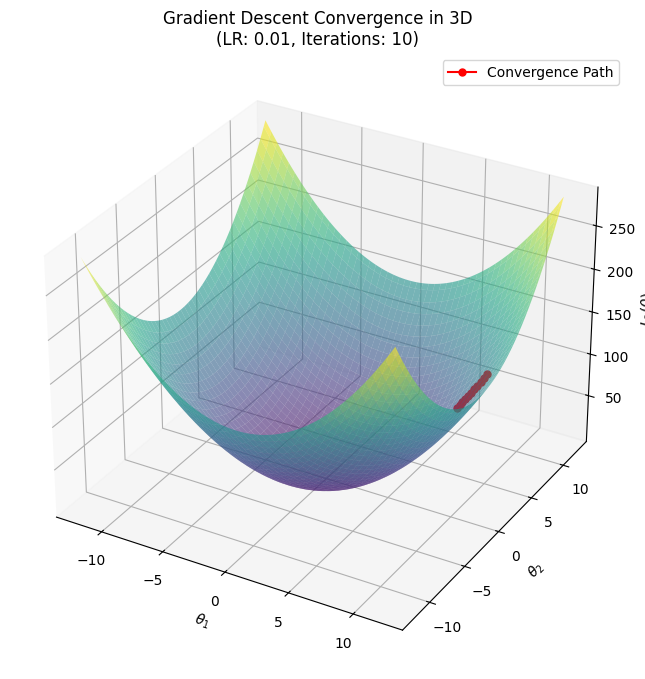

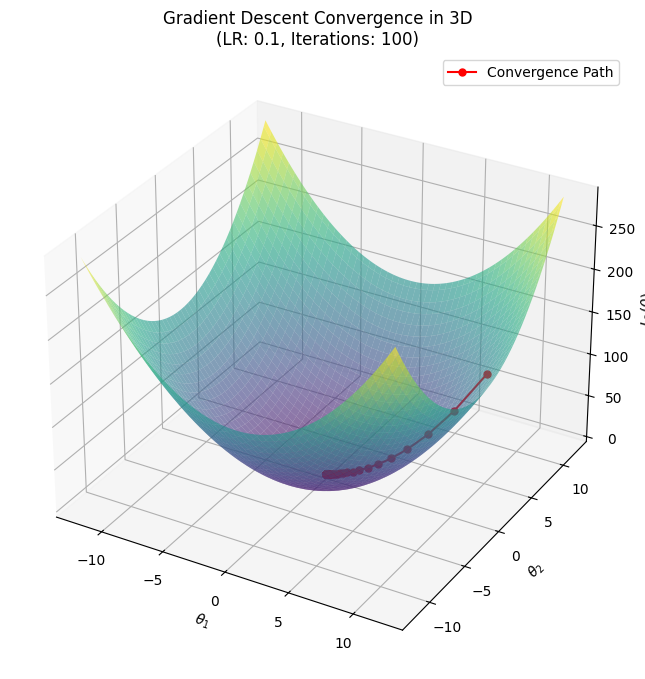

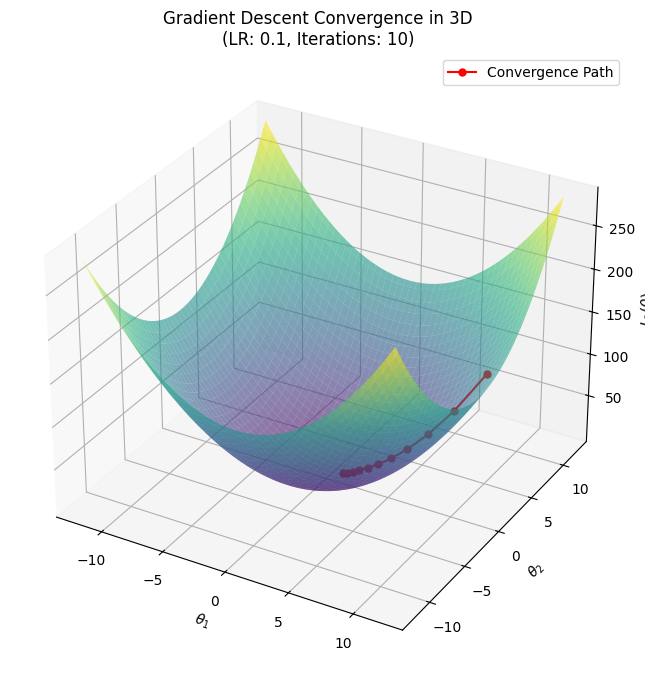

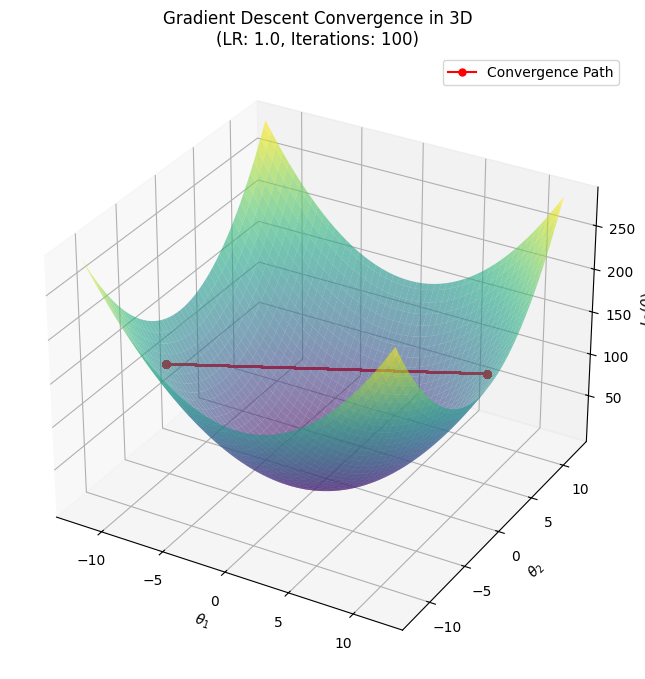

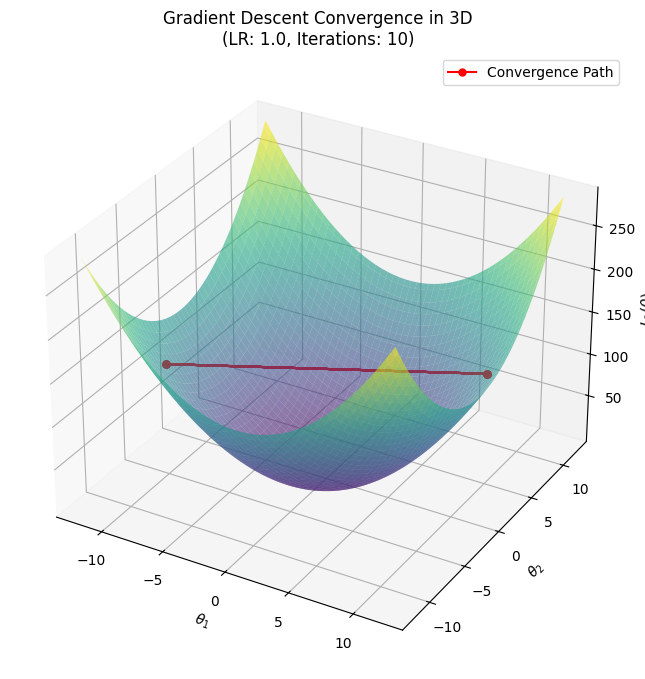

In [2]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati


# Problem 2
# Find the minima of the following functions using Gradient Descent Method with learning rate
# 0.01 and 0.1 and different number of iterations. Try choosing a large value of learning 
# rate and test the convergence. For L_5(theta), use the data file.

# b.) L2(theta) = theta_1^2 + theta_2^2

# Importing Libraries

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Function for calculating next theta values, i.e., gradient descent function

def gradient_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate*gradient
        theta_history.append(theta)

    return theta, theta_history



# Function for plotting graph for 2D case

def plot_convergence_2d(theta_history, learning_rate, num_iterations):
    theta_1_history = [theta[0] for theta in theta_history]
    theta_2_history = [theta[1] for theta in theta_history]

    plt.plot(theta_1_history, theta_2_history, label=f"LR: {learning_rate}, Iterations: {num_iterations}")
    plt.xlabel(r'$\theta_1$')
    plt.ylabel(r'$\theta_2$')
    plt.title('Convergence of Gradient Descent in 2D')
    plt.legend()
    plt.grid(True)


    # Highlight the minimum value of theta

    final_theta = theta_history[-1]

    # Marking the final theta with a red dot
    plt.scatter(final_theta[0], final_theta[1], color="red")

    plt.annotate(f"Min: ({final_theta[0]: .4f}, {final_theta[1]: .4f})", (final_theta[0], final_theta[1]), 
                textcoords="offset points", xytext=(-10,10), ha='center')






# 3-D Graph function

def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    theta1_history = [theta[0] for theta in theta_history]
    theta2_history = [theta[1] for theta in theta_history]
    L_history = [theta1**2 + theta2**2 for theta1, theta2 in theta_history]

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the surface
    theta1_vals = np.linspace(-12, 12, 100)
    theta2_vals = np.linspace(-12, 12, 100)
    theta1_vals, theta2_vals = np.meshgrid(theta1_vals, theta2_vals)
    L_vals = theta1_vals**2 + theta2_vals**2
    ax.plot_surface(theta1_vals, theta2_vals, L_vals, cmap='viridis', alpha=0.6)

    # Plotting the convergence path
    ax.plot(theta1_history, theta2_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel(r'$\theta_1$')
    ax.set_ylabel(r'$\theta_2$')
    ax.set_zlabel(r'$L_2(\theta)$')
    ax.set_title(f'Gradient Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()



# Gradient of L(theta) = theta_1^2 + theta_2^2

def L2_gradient(theta):
    theta_1, theta_2 = theta
    return np.array([2*theta_1, 2*theta_2])


# Initializing theta values (theta_1, theta_2)

theta_init = np.array([10.0, 5.0])


# Different learning rates and iterations

learning_rates = [0.01, 0.1, 1.0]
iterations = [100, 10]


plt.figure(figsize=(10, 6))


# Calculating for plotting 2-D graph

for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = gradient_descent(L2_gradient, theta_init, lr, iters)
        plot_convergence_2d(theta_history, lr, iters)

plt.show()


# Calculating for plotting 3-D graph
# Plotting the convergence paths for different learning rates and iterations

for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = gradient_descent(L2_gradient, theta_init, lr, iters)
        plot_convergence_3d(theta_history, lr, iters)



<h4>
    Conclusion:
</h4>
<ul>
    <li>
        For &theta; = 0.1, and iterations = 10, the gradient descent seems reaching the minimum value, even with number of iterations being 100.
    </li>
    <li>
        For &theta; = 0.01, and iterations = 10, the gradient descent failed to reach the minimum value, with iterations = 100, it reached the minimum value.
    </li>
    <li>
        For &theta; = 1.0, let there be any number of iterations, the gradient descent kept on bouncing to and fro, and did not reach any minimum value.
    </li>
    <li>
        <b>Minimum value of &theta;<sub>1</sub></b> and <b>&theta;<sub>2</sub></b> obtained is 0.0 with its corresponding loss value being 0.0 too.
    </li>
</ul>

<br>
<h3>
    ( c.) L<sub>3</sub> = (&theta; - 1 )<sup>2</sup>
</h3>
<br>


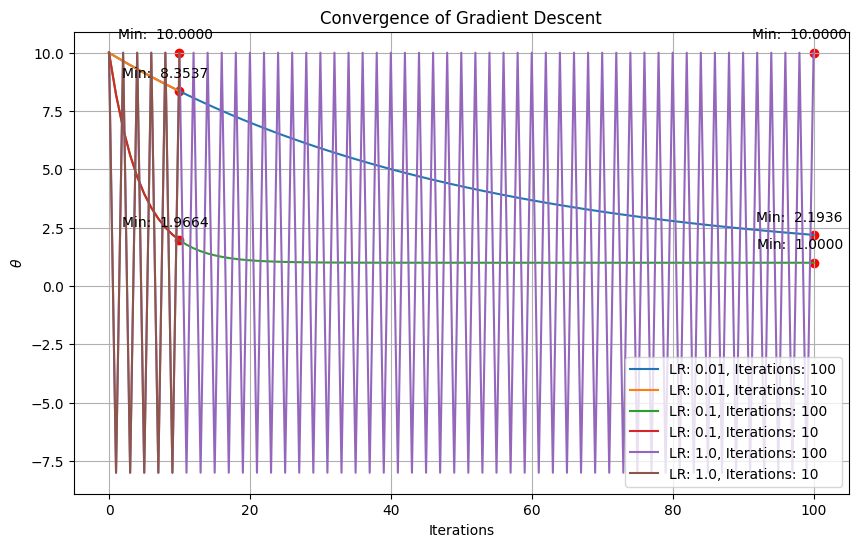

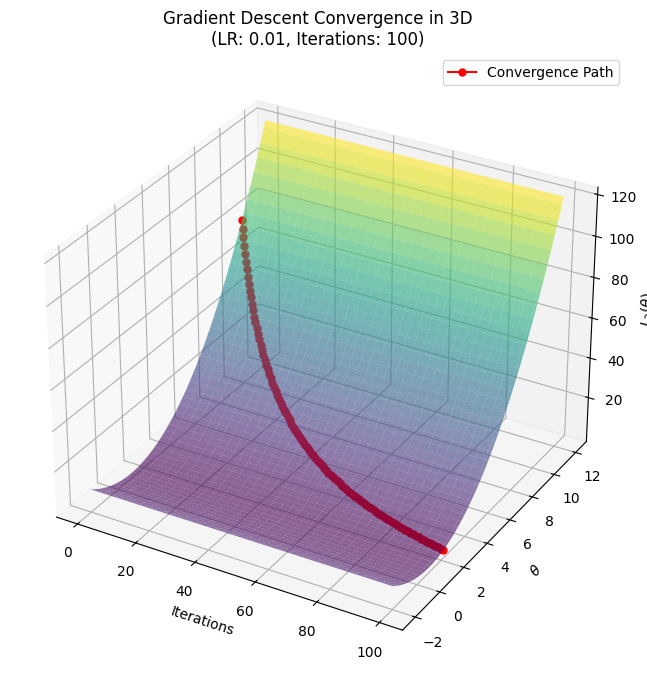

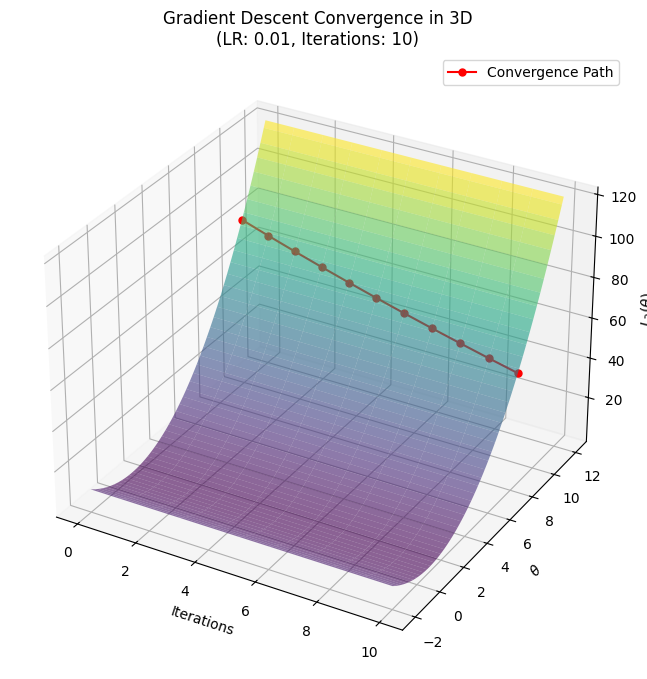

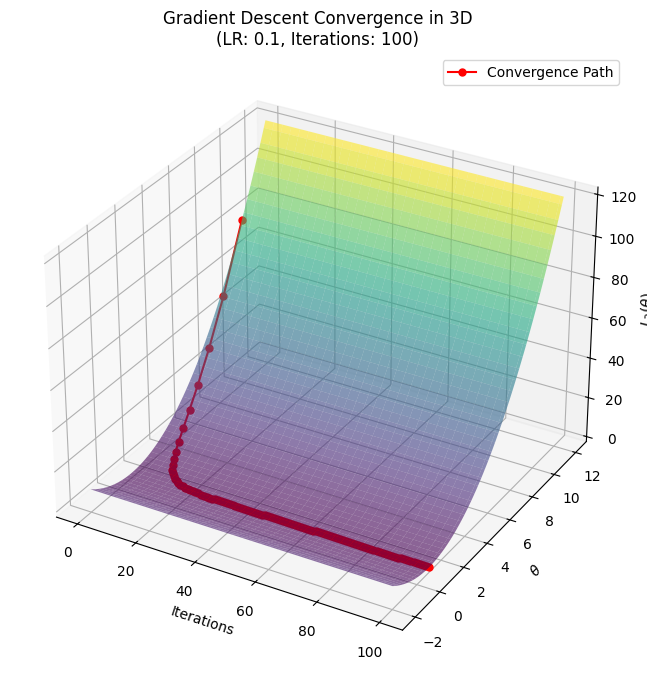

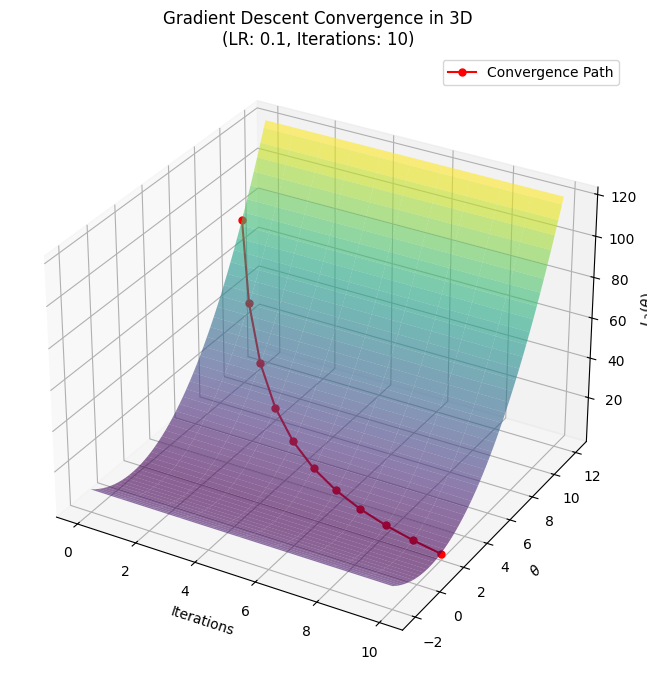

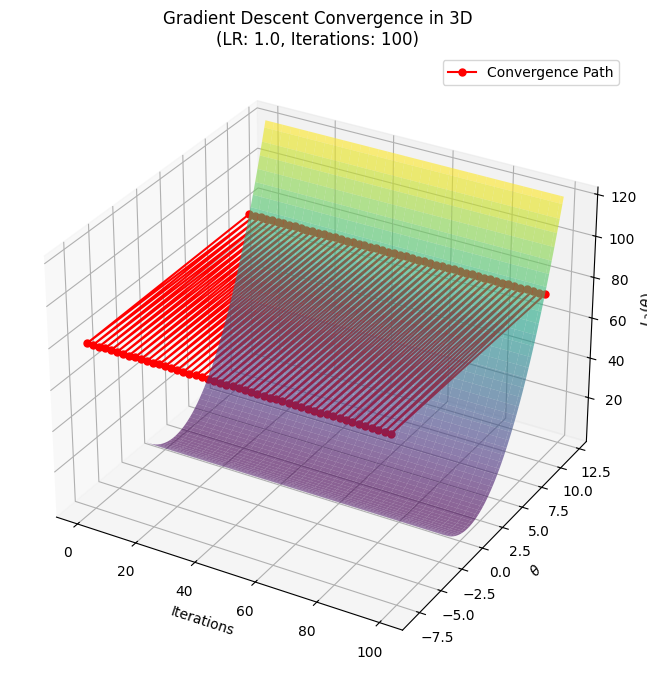

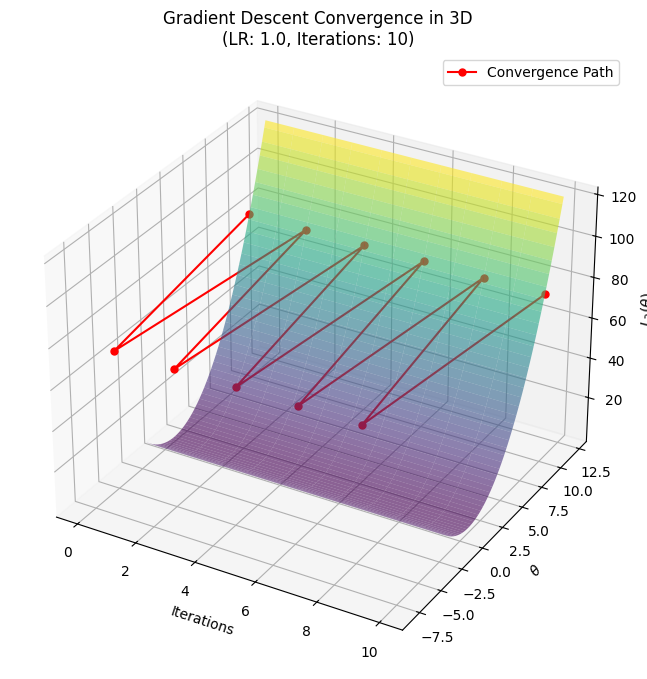

In [3]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati


# Problem 2
# Find the minima of the following functions using Gradient Descent Method with learning rate
# 0.01 and 0.1 and different number of iterations. Try choosing a large value of learning 
# rate and test the convergence. For L_5(theta), use the data file.

# c.) L3(theta) = (theta - 1)^2

# Importing Libraries

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Function for calculating next theta values, i.e., gradient descent function

def gradient_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate*gradient
        theta_history.append(theta)

    return theta, theta_history



# Function for plotting graph for 2D case

def plot_convergence_2d(theta_history, learning_rate, num_iterations):
    plt.plot(theta_history, label=f"LR: {learning_rate}, Iterations: {num_iterations}")
    plt.xlabel('Iterations')
    plt.ylabel(r'$\theta$')
    plt.title('Convergence of Gradient Descent')
    plt.legend()
    plt.grid(True)



     # Highlight the minimum value of theta
    final_theta = theta_history[-1]

    # Marking the final theta with a red dot
    plt.scatter(len(theta_history) - 1, final_theta, color="red")

    plt.annotate(f"Min: {final_theta: .4f}", (len(theta_history) - 1, final_theta), 
                textcoords="offset points", xytext=(-10,10), ha='center')




# 3-D Graph function

def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    iterations = range(len(theta_history))
    L_history = [(theta - 1) ** 2 for theta in theta_history]

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the surface
    theta_vals = np.linspace(-2, 12, 100)
    theta_vals_mesh, iter_mesh = np.meshgrid(theta_vals, iterations)
    L_vals = (theta_vals_mesh - 1) ** 2

    ax.plot_surface(iter_mesh, theta_vals_mesh, L_vals, cmap='viridis', alpha=0.6)

    # Plotting the convergence path
    ax.plot(iterations, theta_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel('Iterations')
    ax.set_ylabel(r'$\theta$')
    ax.set_zlabel(r'$L_3(\theta)$')
    ax.set_title(f'Gradient Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()




# Gradient of L(theta) = (theta-1)^2

def L3_gradient(theta):
    return 2*(theta-1)



# Initializing theta value
theta_init = 10.0


# Different learning rates and iterations
learning_rates = [0.01, 0.1, 1.0]
iterations = [100, 10]


plt.figure(figsize=(10, 6))


# Calculating for plotting 2-D graph
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = gradient_descent(L3_gradient, theta_init, lr, iters)
        plot_convergence_2d(theta_history, lr, iters)



# Calculating for plotting 3-D graph
# Plotting the convergence paths for different learning rates and iterations

for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = gradient_descent(L3_gradient, theta_init, lr, iters)
        plot_convergence_3d(theta_history, lr, iters)

plt.show()

<h4>
    Conclusion:
</h4>
<ul>
    <li>
        For &theta; = 0.1, and iterations = 10, the gradient descent seems reaching the minimum value, even with number of iterations being 100.
    </li>
    <li>
        For &theta; = 0.01, and iterations = 10, the gradient descent failed to reach the minimum value, with iterations = 100, it reached the minimum value with a very slow approach.
    </li>
    <li>
        For &theta; = 1.0, let there be any number of iterations, the gradient descent kept on bouncing to and fro, and did not reach any minimum value.
    </li>
    <li>
        <b>Minimum value of &theta; obtained is 1.0 </b> with its corresponding loss value being 0.0.
    </li>
</ul>

<br>
<h3>
    ( d.) L<sub>4</sub>(&theta;) = 2(&theta;<sub>1</sub> - 1)<sup>2</sup> + 2(&theta;<sub>2</sub> + 1)<sup>2</sup>
</h3>
<br>

<Figure size 1000x600 with 0 Axes>

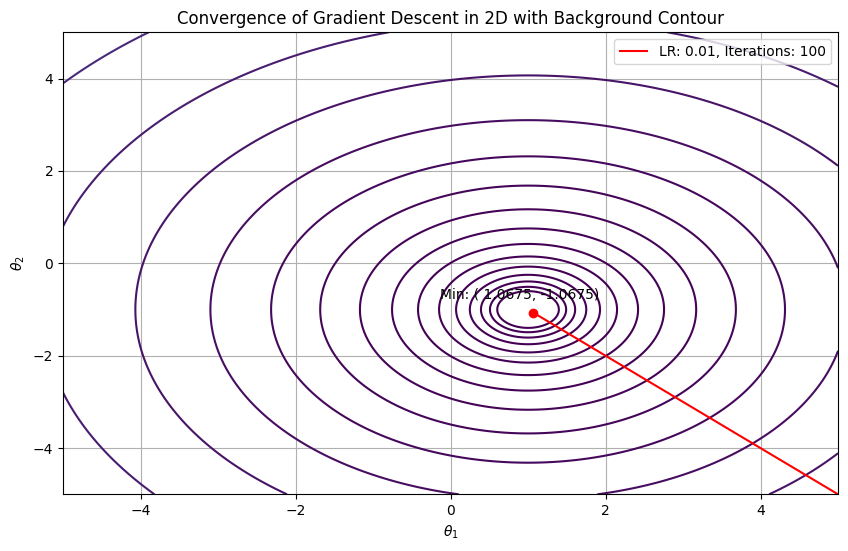

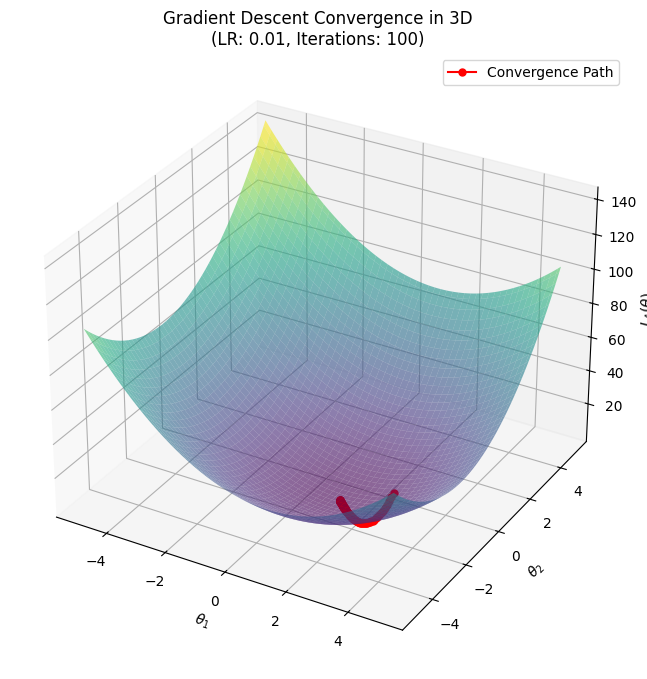

<Figure size 1000x600 with 0 Axes>

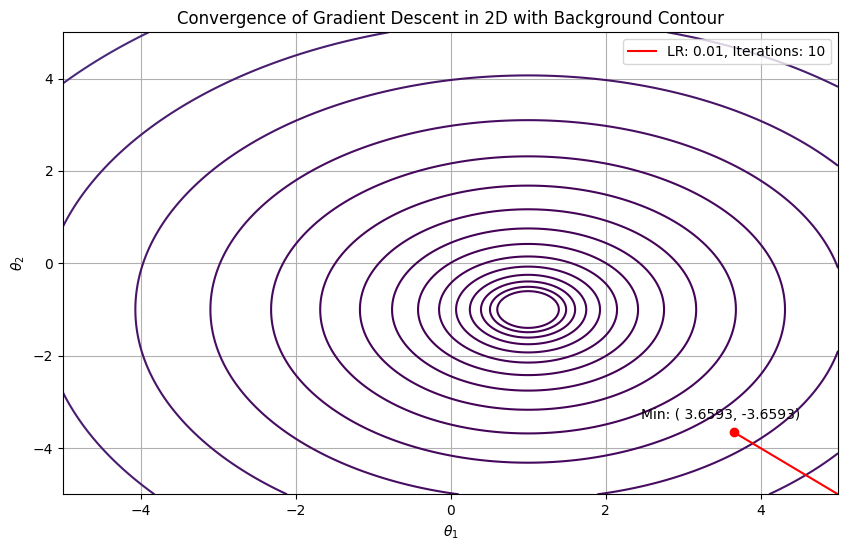

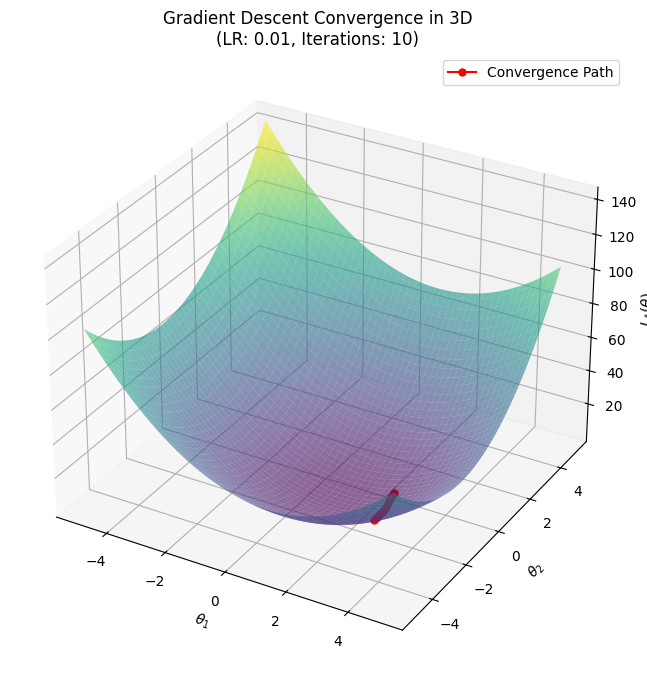

<Figure size 1000x600 with 0 Axes>

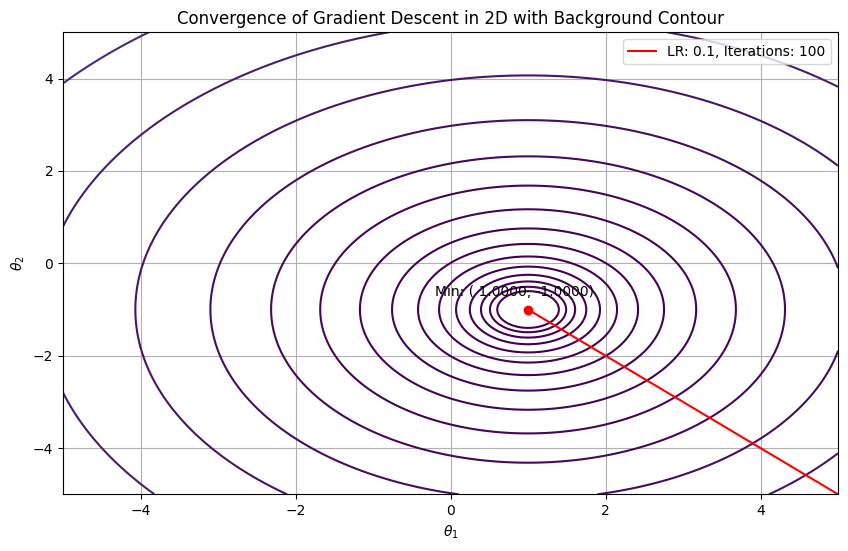

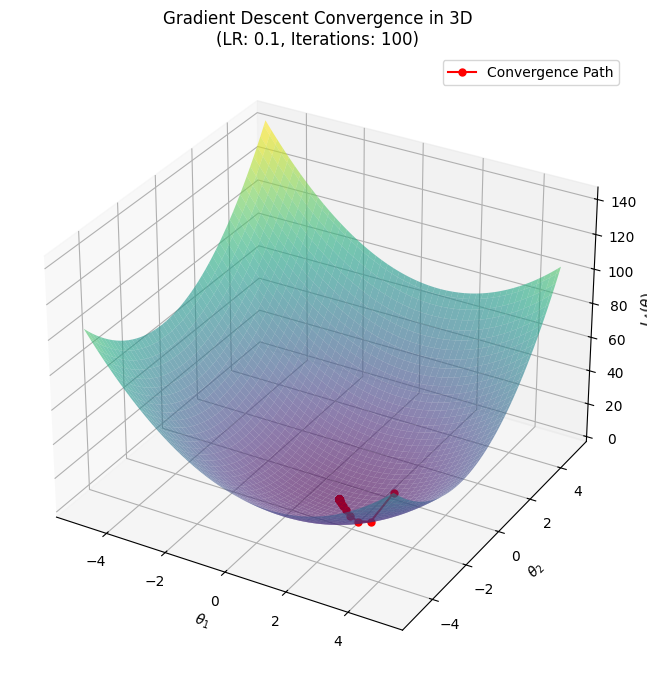

<Figure size 1000x600 with 0 Axes>

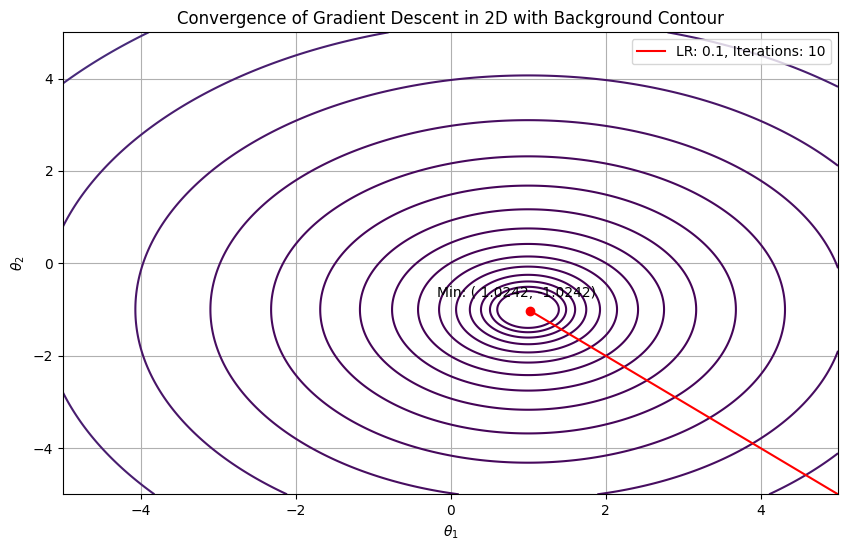

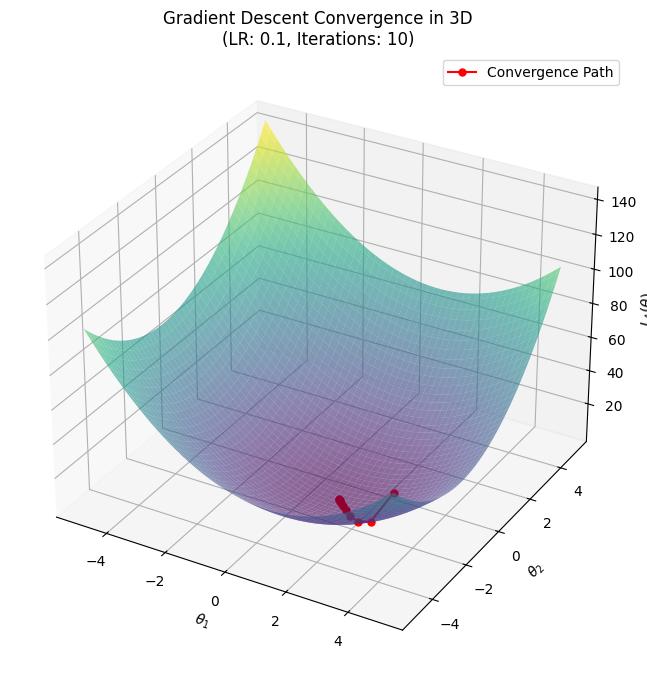

<Figure size 1000x600 with 0 Axes>

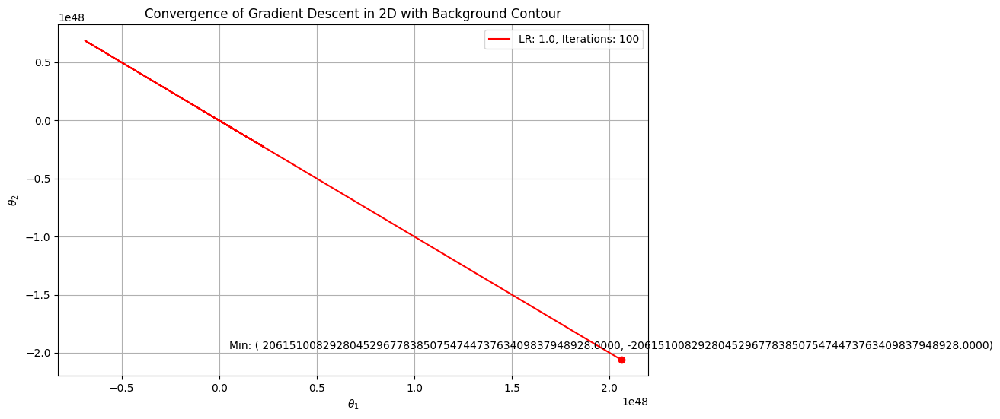

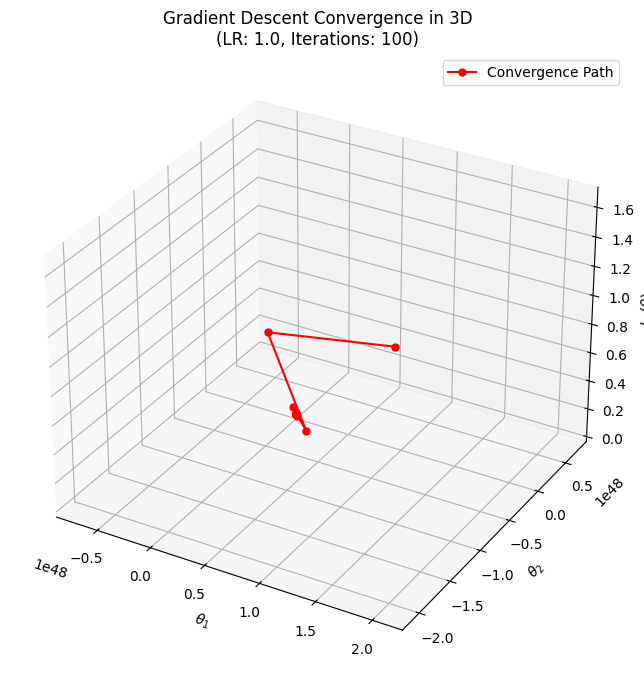

<Figure size 1000x600 with 0 Axes>

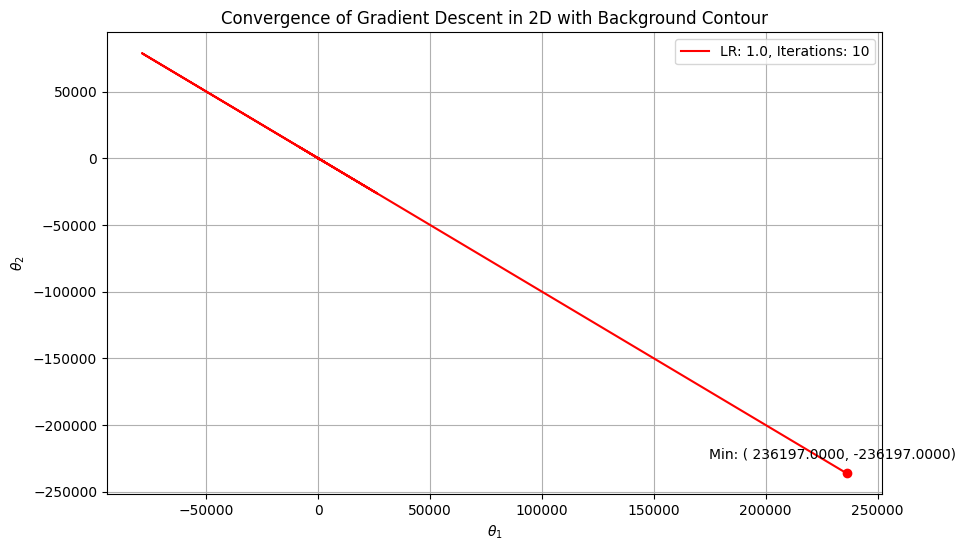

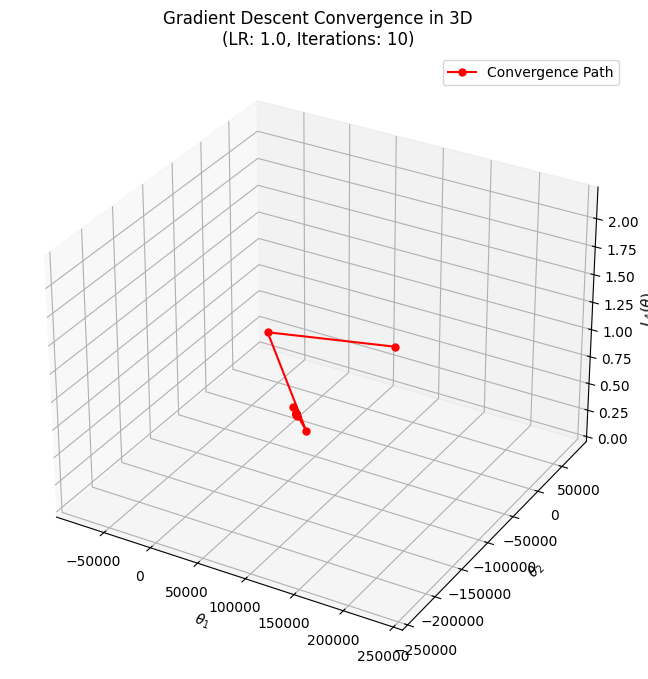

In [4]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 2
# Find the minima of the following functions using Gradient Descent Method with learning rate
# 0.01 and 0.1 and different number of iterations. Try choosing a large value of learning 
# rate and test the convergence. For L_5(theta), use the data file.

# d.) L4(theta) = 2(theta_1 - 1)^2 + 2(theta_2 + 1)^2

# Importing Libraries

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Function for calculating next theta values, i.e., gradient descent function

def gradient_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate * gradient
        theta_history.append(theta)

    return theta, theta_history


# Function for plotting 2D convergence with background contour
def plot_convergence_2d_with_contour(theta_history, learning_rate, num_iterations):
    # Create a meshgrid for contour plotting
    theta1_vals = np.linspace(-5, 5, 400)
    theta2_vals = np.linspace(-5, 5, 400)
    theta1_vals, theta2_vals = np.meshgrid(theta1_vals, theta2_vals)
    L_vals = 2 * (theta1_vals - 1) ** 2 + 2 * (theta2_vals + 1) ** 2
    
    plt.figure(figsize=(10, 6))
    
    # Plot contour of the loss function
    plt.contour(theta1_vals, theta2_vals, L_vals, levels=np.logspace(-0.5, 3, 20), cmap='viridis')
    
    # Plot the convergence path
    theta_1_history = [theta[0] for theta in theta_history]
    theta_2_history = [theta[1] for theta in theta_history]
    plt.plot(theta_1_history, theta_2_history, label=f"LR: {learning_rate}, Iterations: {num_iterations}", color='red')
    plt.xlabel(r'$\theta_1$')
    plt.ylabel(r'$\theta_2$')
    plt.title('Convergence of Gradient Descent in 2D with Background Contour')
    plt.legend()
    plt.grid(True)

    # Highlight the minimum value of theta
    final_theta = theta_history[-1]
    plt.scatter(final_theta[0], final_theta[1], color="red")
    plt.annotate(f"Min: ({final_theta[0]: .4f}, {final_theta[1]: .4f})", (final_theta[0], final_theta[1]), 
                 textcoords="offset points", xytext=(-10,10), ha='center')
    
    plt.show()


# Function for plotting 3D convergence

def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    theta1_history = [theta[0] for theta in theta_history]
    theta2_history = [theta[1] for theta in theta_history]
    L_history = [2 * (theta1 - 1) ** 2 + 2 * (theta2 + 1) ** 2 for theta1, theta2 in theta_history]

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the surface
    theta1_vals = np.linspace(-5, 5, 100)
    theta2_vals = np.linspace(-5, 5, 100)
    theta1_vals, theta2_vals = np.meshgrid(theta1_vals, theta2_vals)
    L_vals = 2 * (theta1_vals - 1) ** 2 + 2 * (theta2_vals + 1) ** 2
    ax.plot_surface(theta1_vals, theta2_vals, L_vals, cmap='viridis', alpha=0.6)

    # Plotting the convergence path
    ax.plot(theta1_history, theta2_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel(r'$\theta_1$')
    ax.set_ylabel(r'$\theta_2$')
    ax.set_zlabel(r'$L_4(\theta)$')
    ax.set_title(f'Gradient Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()


# Gradient of L4(theta) = 2(theta_1 - 1)^2 + 2(theta_2 + 1)^2

def L4_gradient(theta):
    theta_1, theta_2 = theta
    grad_theta_1 = 4 * (theta_1 - 1)
    grad_theta_2 = 4 * (theta_2 + 1)
    return np.array([grad_theta_1, grad_theta_2])


# Initializing theta values (theta_1, theta_2)

theta_init = np.array([5.0, -5.0])


# Different learning rates and iterations

learning_rates = [0.01, 0.1, 1.0]
iterations = [100, 10]


# Plotting 2D and 3D convergence paths for different learning rates and iterations

for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = gradient_descent(L4_gradient, theta_init, lr, iters)
        
        # 2D Plot
        plt.figure(figsize=(10, 6))
        # 2D Plot with Contour
        plot_convergence_2d_with_contour(theta_history, lr, iters)
        
        # 3D Plot
        plot_convergence_3d(theta_history, lr, iters)


<h4>
    Conclusion:
</h4>
<ul>
    <li>
        For learning rate = 0.1, and iterations = 10, the gradient descent seems reaching the minimum value, even with number of iterations being 100.
    </li>
    <li>
        For learning rate = 0.01, and iterations = 10, the gradient descent failed to reach the minimum value, with iterations = 100, it reached the minimum value with a very slow approach, still not that accurate in comparison with learning rate = 0.01.
    </li>
    <li>
        For learning rate = 1.0, the graph became erratic, overshooted minimum and converged at a different point.
    </li>
    <li>
        <b>Minimum value of loss function obtained is 0.0 </b>, at &theta;<sub>1</sub> = 1.0 and &theta;<sub>2</sub> = -1.0, which obtained for learning rate = 0.1 and iterations = 100.
    </li>
</ul>

<br>
<h3>
    ( e.) L<sub>5</sub>(&theta;) = &Sigma;<sub>i=1</sub><sup>m</sup>(y<sub>i</sub> - (&theta;<sub>0</sub> + &theta;<sub>1</sub>.x<sub>i</sub>))<sup>2</sup>
</h3>
<br>

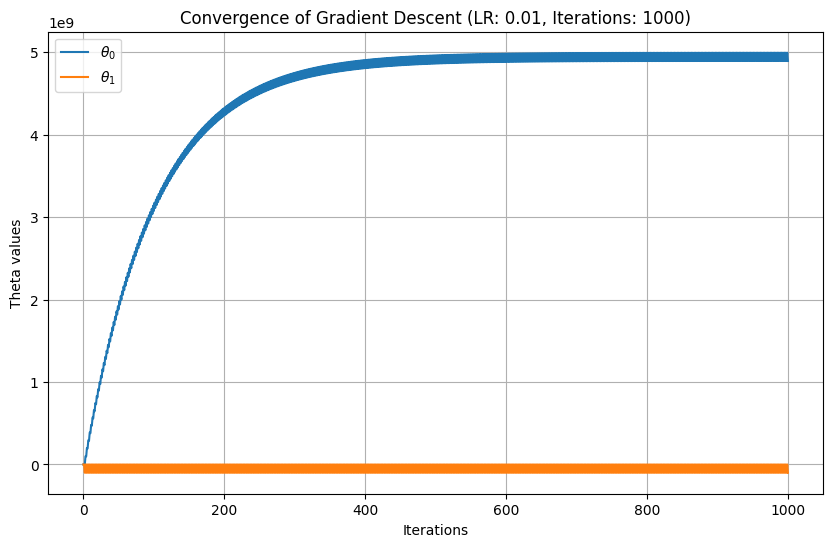

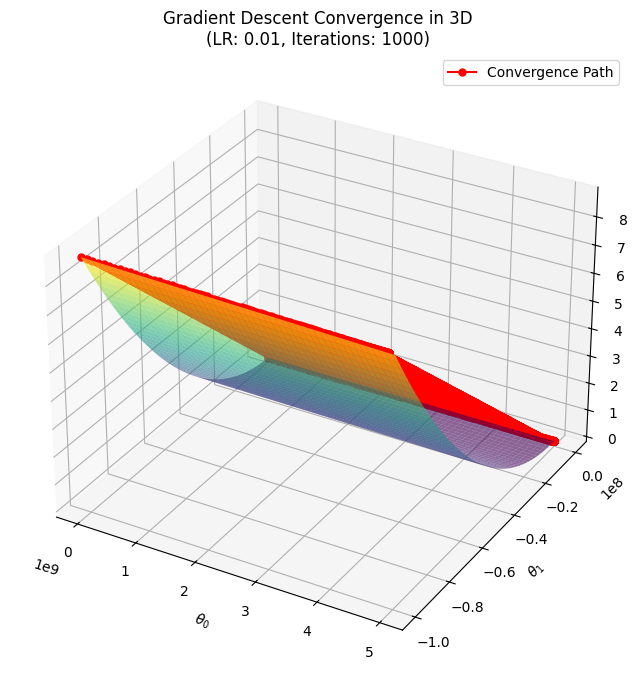

Final theta values for LR: 0.01, Iterations: 1000 -> theta_0: 4895954202.5181, theta_1: -99998703.8473
Final loss value: 91288204214736292675584.0000


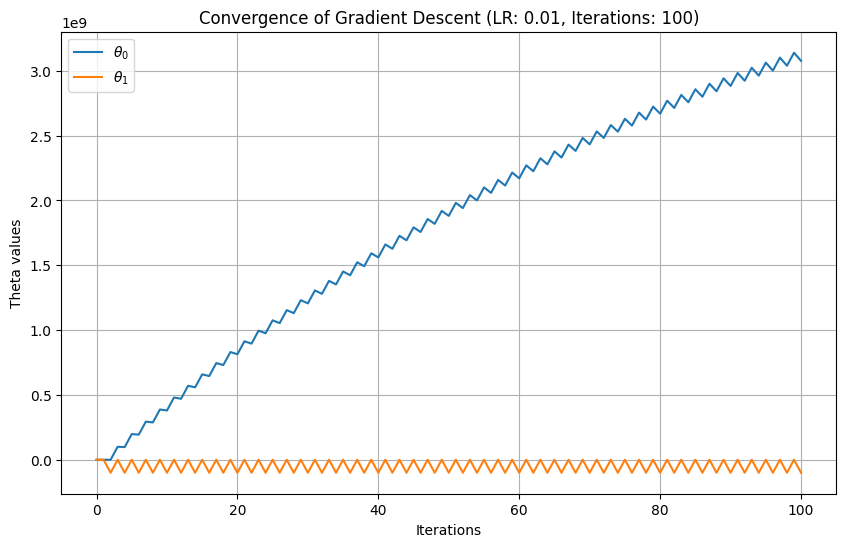

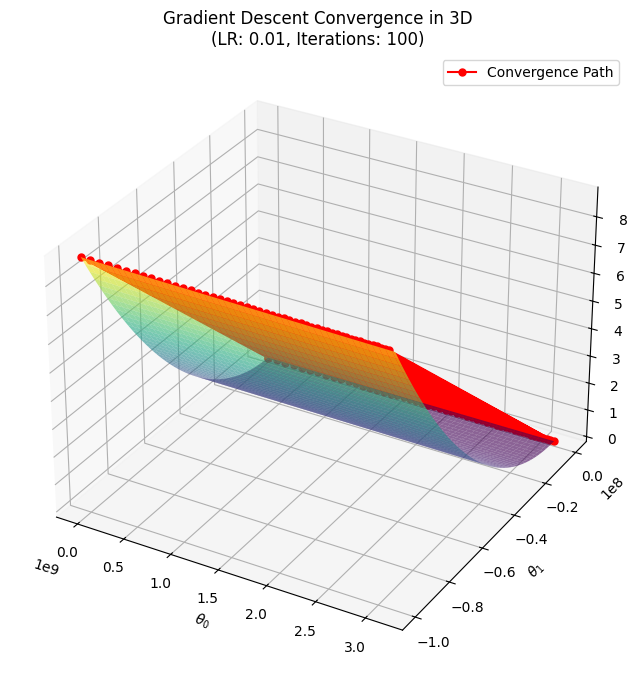

Final theta values for LR: 0.01, Iterations: 100 -> theta_0: 3076709480.3125, theta_1: -99998703.8473
Final loss value: 92351871075020127076352.0000


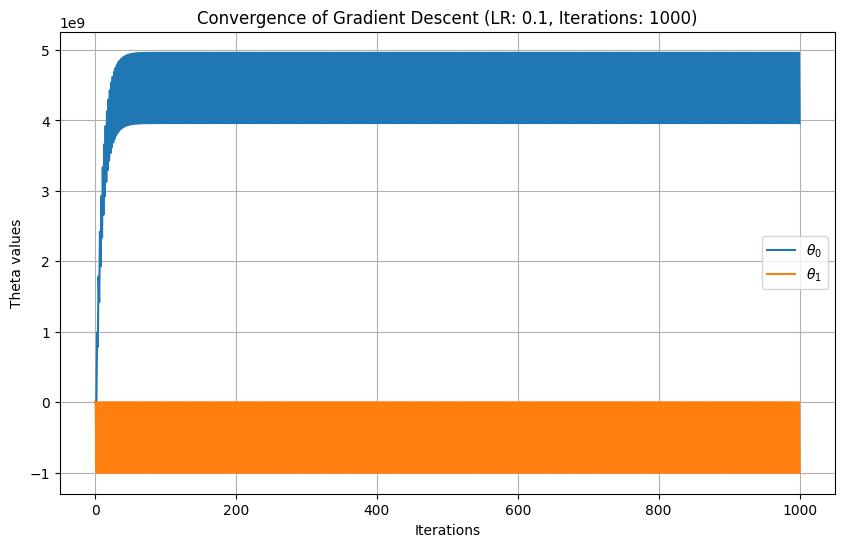

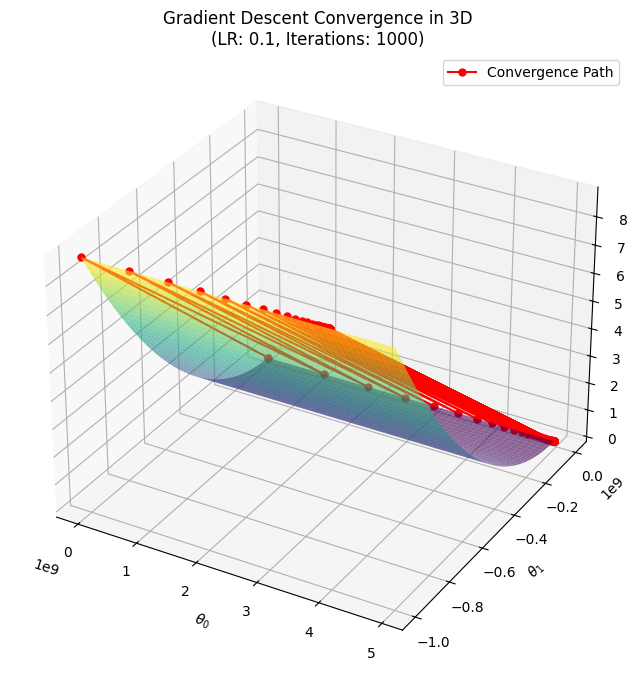

Final theta values for LR: 0.1, Iterations: 1000 -> theta_0: 3961591435.3119, theta_1: -999987038.4734
Final loss value: 9393118368844872914305024.0000


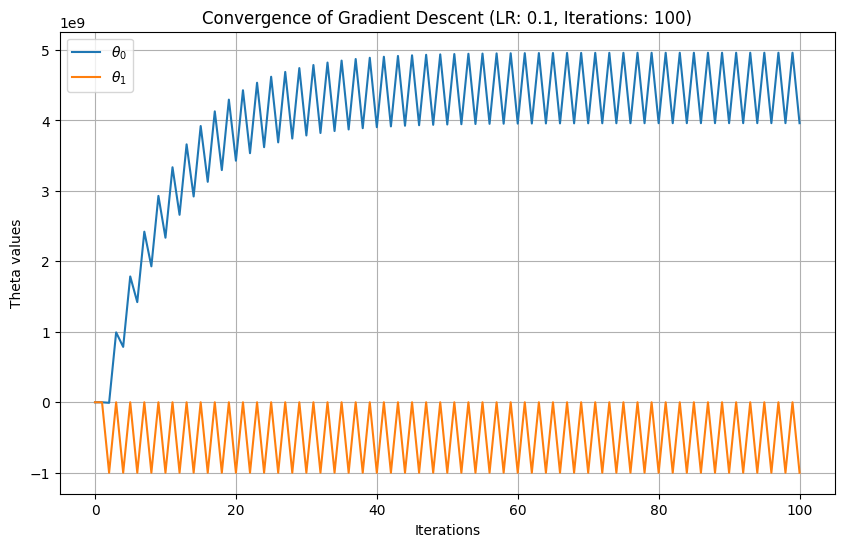

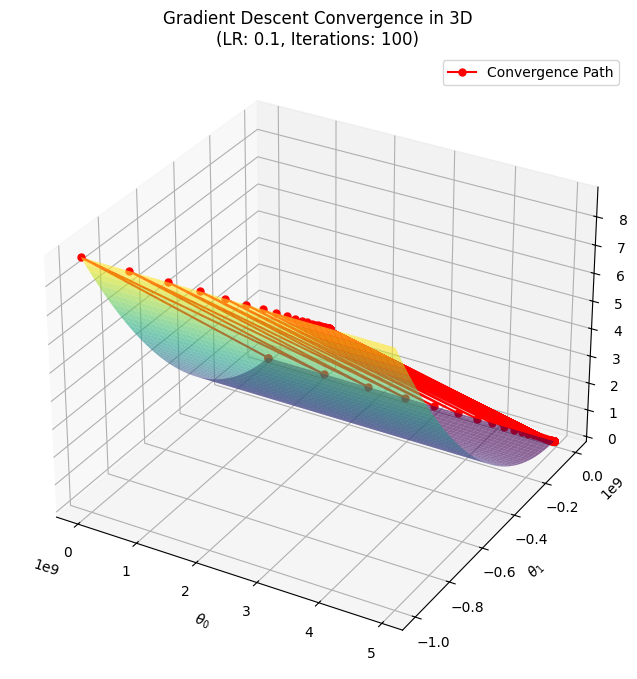

Final theta values for LR: 0.1, Iterations: 100 -> theta_0: 3961520621.1127, theta_1: -999987038.4734
Final loss value: 9393118787962483331039232.0000


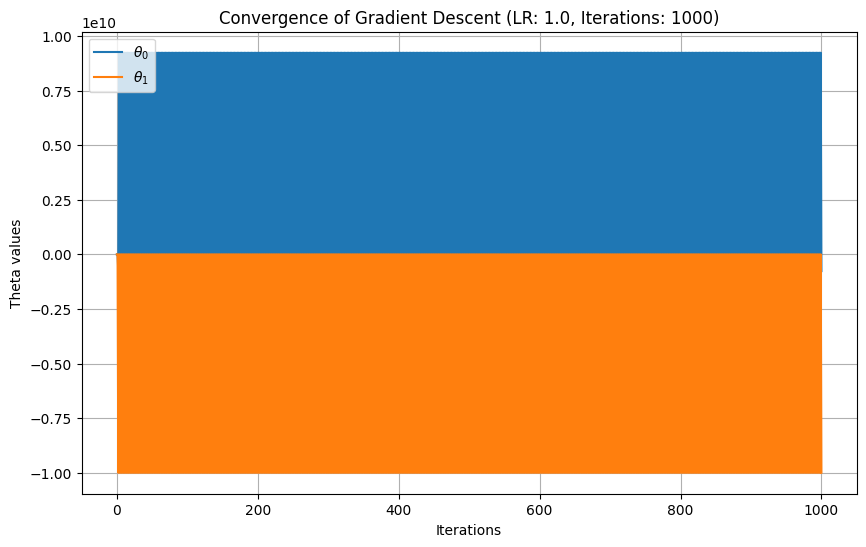

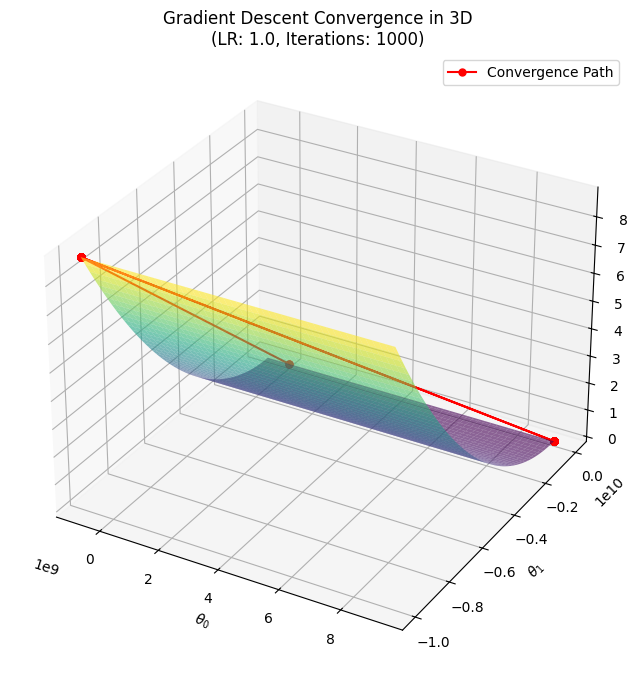

Final theta values for LR: 1.0, Iterations: 1000 -> theta_0: -768171768.1258, theta_1: -9999870384.7340
Final loss value: 941703621365216238131740672.0000


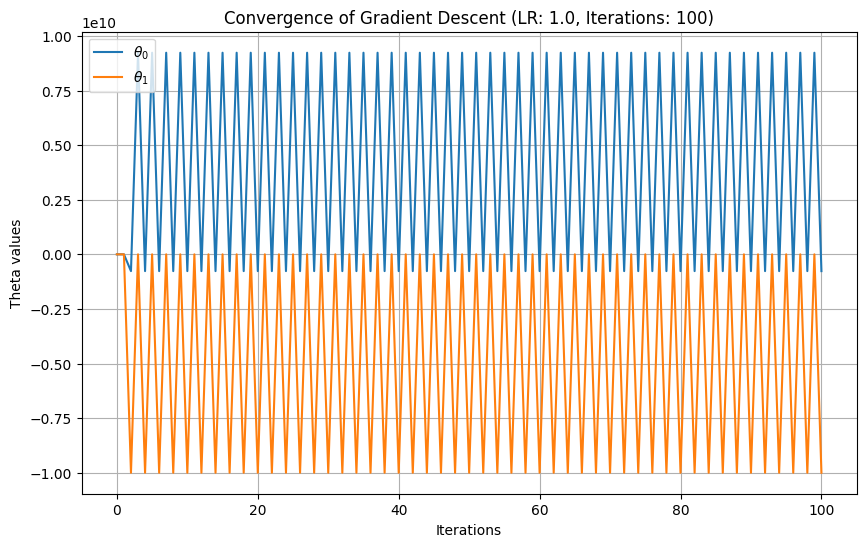

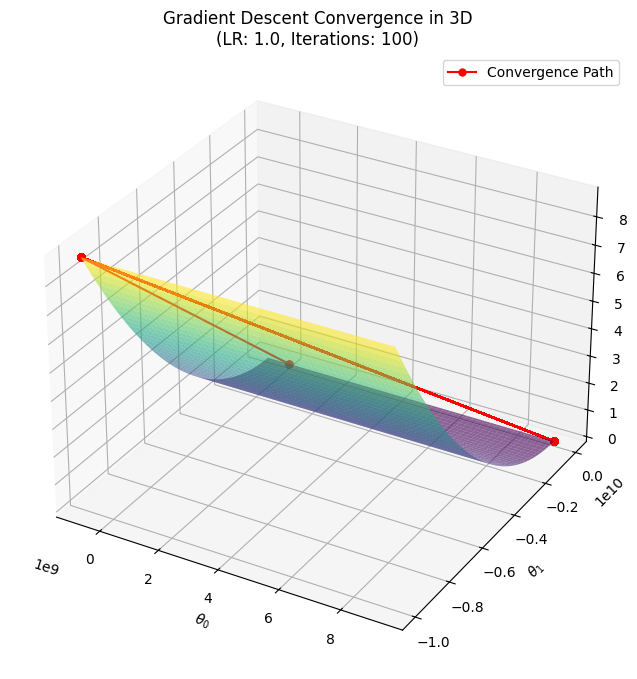

Final theta values for LR: 1.0, Iterations: 100 -> theta_0: -768171768.1258, theta_1: -9999870384.7340
Final loss value: 941703621365216238131740672.0000


In [5]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 2
# Find the minima of the following functions using Gradient Descent Method with learning rate
# 0.01 and 0.1 and different number of iterations. Try choosing a large value of learning 
# rate and test the convergence. For L_5(theta), use the data file.

# e.) L5(theta) = SUM(yi - (theta_0 + theta_1.xi))^2 where i=1 to m

# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the dataset using pandas
url = r'https://raw.githubusercontent.com/ManishPraa24/Linear-Regression/main/Data.csv'
data = pd.read_csv(url)

# Extracting X and Y
X = data['x'].values
Y = data['y'].values
m = len(Y)  # number of data points

# Gradient of L5(theta)
def L5_gradient(theta):
    theta_0, theta_1 = theta
    grad_theta_0 = (-2/m) * np.sum(Y - (theta_0 + theta_1 * X))
    grad_theta_1 = (-2/m) * np.sum((Y - (theta_0 + theta_1 * X)) * X)

    # Gradient clipping to avoid overflow
    grad_theta_0 = np.clip(grad_theta_0, -1e10, 1e10)
    grad_theta_1 = np.clip(grad_theta_1, -1e10, 1e10)
    
    return np.array([grad_theta_0, grad_theta_1])

# Initialize theta values (theta_0, theta_1)
theta_init = np.array([0.0, 0.0])

# Gradient Descent Function
def gradient_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate * gradient
        theta_history.append(theta)

        # Check for overflow or NaN values
        if np.any(np.isnan(theta)) or np.any(np.isinf(theta)):
            print(f"Overflow/NaN encountered at iteration {i} with learning rate {learning_rate}.")
            break

    return theta, theta_history



# Function to compute the loss for given theta
def compute_loss(theta):
    theta_0, theta_1 = theta
    loss = np.sum((Y - (theta_0 + theta_1 * X))**2) / m
    return loss



# Plotting 2D Convergence (Theta values over iterations)
def plot_convergence_2d(theta_history, learning_rate, num_iterations):
    theta_0_history = [theta[0] for theta in theta_history]
    theta_1_history = [theta[1] for theta in theta_history]
    
    plt.figure(figsize=(10, 6))
    
    plt.plot(theta_0_history, label=r'$\theta_0$')
    plt.plot(theta_1_history, label=r'$\theta_1$')
    plt.xlabel('Iterations')
    plt.ylabel('Theta values')
    plt.title(f'Convergence of Gradient Descent (LR: {learning_rate}, Iterations: {num_iterations})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotting 3D Convergence with Background Loss Function Surface
def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    theta_0_history = [theta[0] for theta in theta_history]
    theta_1_history = [theta[1] for theta in theta_history]
    
    # Calculate the loss values for the history of thetas
    L_history = [
        np.sum((Y - (theta_0 + theta_1 * X))**2) for theta_0, theta_1 in zip(theta_0_history, theta_1_history)
    ]

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the background surface of the loss function
    theta0_vals = np.linspace(min(theta_0_history), max(theta_0_history), 100)
    theta1_vals = np.linspace(min(theta_1_history), max(theta_1_history), 100)
    theta0_vals, theta1_vals = np.meshgrid(theta0_vals, theta1_vals)
    L_vals = np.array([
        np.sum((Y - (theta0 + theta1 * X))**2)
        for theta0, theta1 in zip(np.ravel(theta0_vals), np.ravel(theta1_vals))
    ])
    L_vals = L_vals.reshape(theta0_vals.shape)
    
    ax.plot_surface(theta0_vals, theta1_vals, L_vals, cmap='viridis', alpha=0.6)

    # Plotting the convergence path
    ax.plot(theta_0_history, theta_1_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel(r'$\theta_0$')
    ax.set_ylabel(r'$\theta_1$')
    ax.set_zlabel(r'$L_5(\theta)$')
    ax.set_title(f'Gradient Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()

# Different learning rates and iterations
learning_rates = [0.01, 0.1, 1.0]

# Here, the iterations taken are large in number according to the size of data set
iterations = [1000, 100]

# Applying Gradient Descent and Plotting Results
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = gradient_descent(L5_gradient, theta_init, lr, iters)
        
        # 2D Plot
        plot_convergence_2d(theta_history, lr, iters)
        
        # 3D Plot with Background Loss Function
        plot_convergence_3d(theta_history, lr, iters)

        final_loss = compute_loss(theta_min)
        print(f'Final theta values for LR: {lr}, Iterations: {iters} -> theta_0: {theta_min[0]:.4f}, theta_1: {theta_min[1]:.4f}')
        print(f'Final loss value: {final_loss:.4f}')


<h4>
    Conclusion:
</h4>
<ul> 
    <li>
        For learning rate = 0.01, and iterations = 1000, the graph seemed more focused in convergence, compared to other parameters, with these parameters we saw it converging nearer to minimum value. The loss function value value obtained is 91288204214736292675584.00.
    </li>
    <li>
        With same learning rate of 0.01, and less number of iterations, i.e., 100, the gradient descent function just failed to reach the minimum value, with the loss function value at obtained &theta;s as 92351871075020127076352.00.
    </li>
    <li>
        For learning rate = 0.1, and iterations = 1000, the gradient descent again just obtained an optimal loss value of 9393118368844872914305024.00, much more than the minimum one obtained earlier.
    </li>
    <li>
        With same learning and less number of iterations, i.e., 100, the gradient descent function obtained a higher loss value than that with more number of iterations, i.e., 9393118787962483331039232.00.
    </li>
    <li>
        For learning rate = 1.0, and the number of iterations = 1000, the gradient descent function's approach path to minima was bouncing to and fro, although it just reached near to minima, with a loss value of 941703621365216238131740672.00.
    </li>
    <li>
        With same learning rate and less number of iterations, i.e., 100, the gradient descent function kept the same approach path for reaching minima, but failed to do so, with same loss value of 941703621365216238131740672.00.
    </li>
    <li>
        From above different cases, the <b>minimum loss value obtained was at learning rate = 0.01, and iterations = 1000 </b>, of value 91288204214736292675584.00.
    </li>
</ul>

<br>
<h3>
    Problem 3 : Find minimum of the function L(&theta;) = &Sigma;<sup>m</sup><sub>i=1</sub>(y<sub>i</sub> - (&theta;<sub>0</sub> + &theta;<sub>1</sub>.x<sub>i</sub>))<sup>2</sup> using the Stochastic Gradient Descent method (Take the date from the data file). Choose different learning rates and number of iterations.
</h3>
<br>

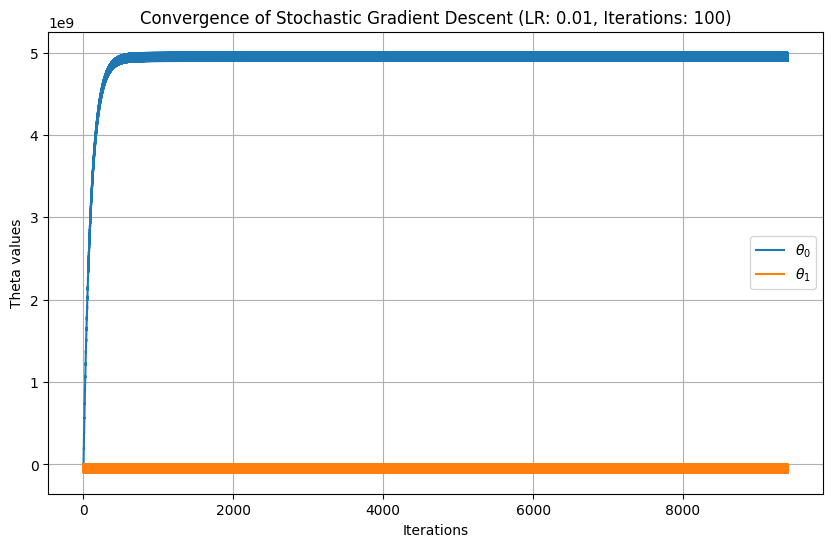

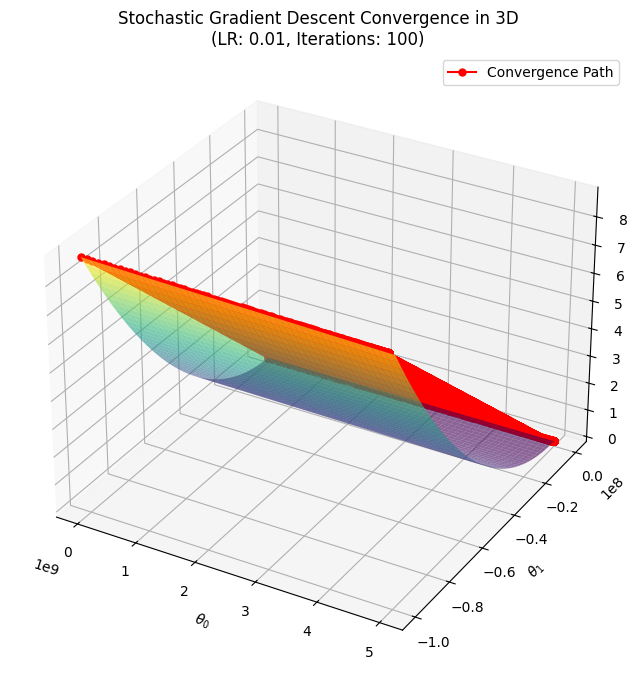

Final theta values for LR: 0.01, Iterations: 100 -> theta_0: 4897701265.8895, theta_1: -99998738.5600, Loss: 8581001528207465007546368.0000


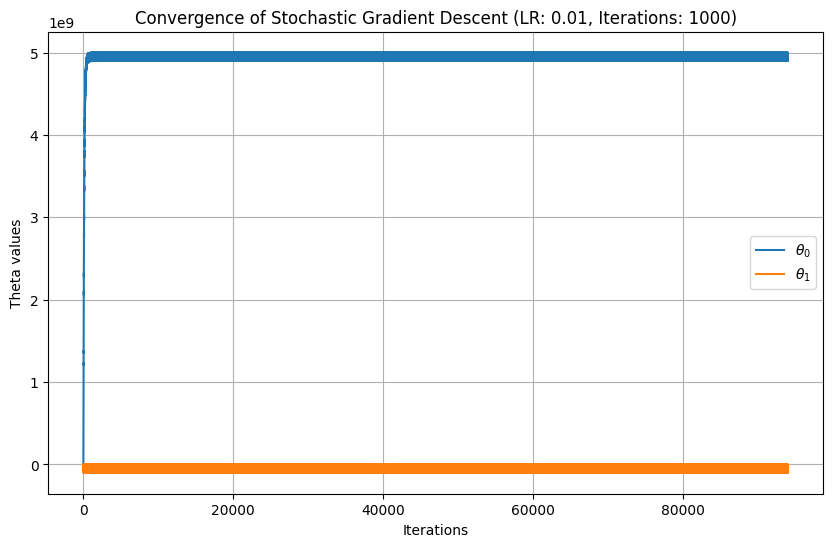

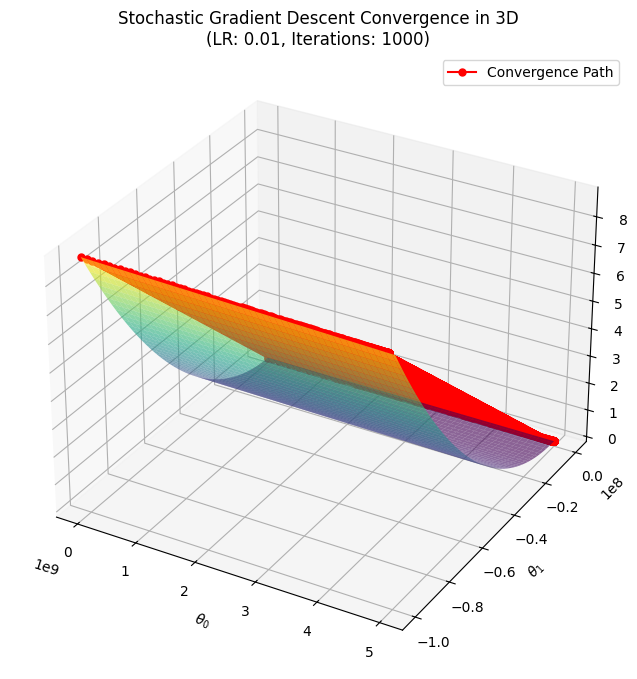

Final theta values for LR: 0.01, Iterations: 1000 -> theta_0: 4897735748.1996, theta_1: -99998738.5600, Loss: 8580999638986309033263104.0000


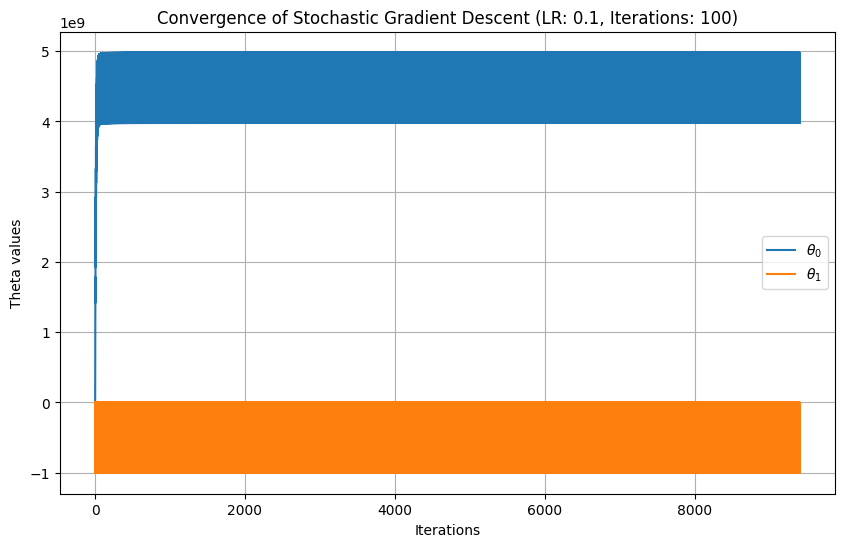

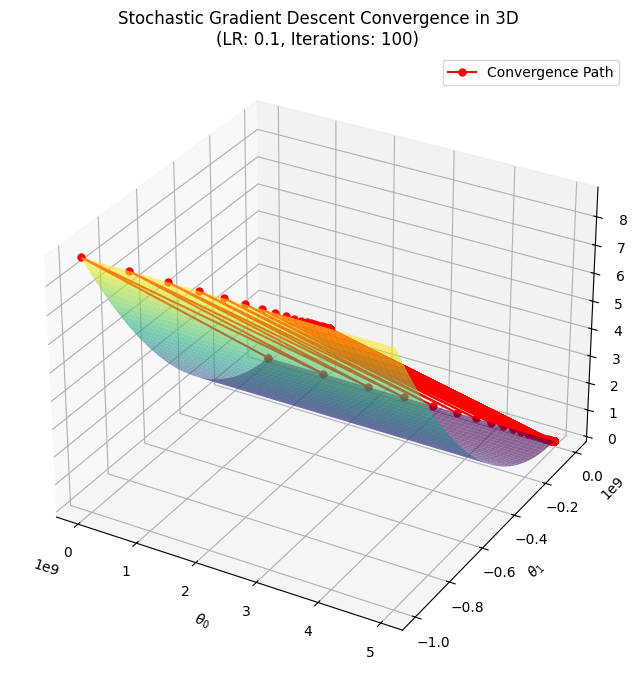

Final theta values for LR: 0.1, Iterations: 100 -> theta_0: 3977357184.9995, theta_1: -999987385.6000, Loss: 882944969277647309481443328.0000


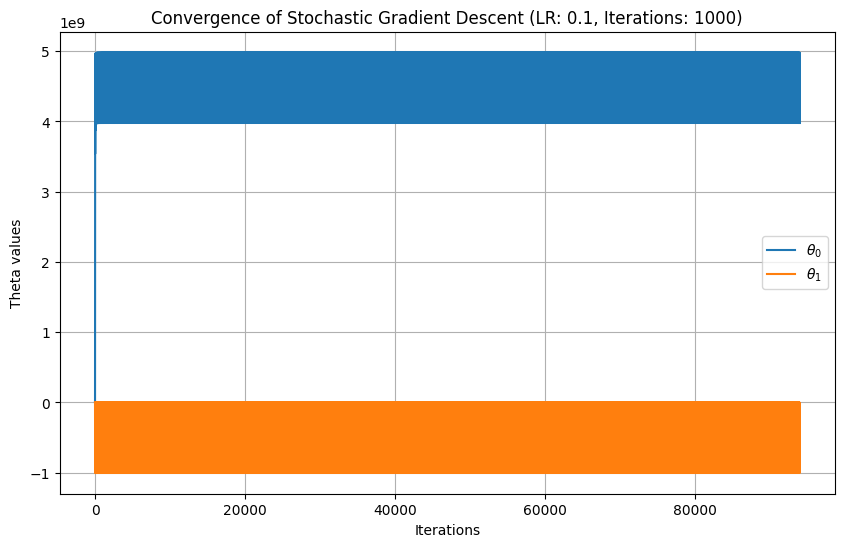

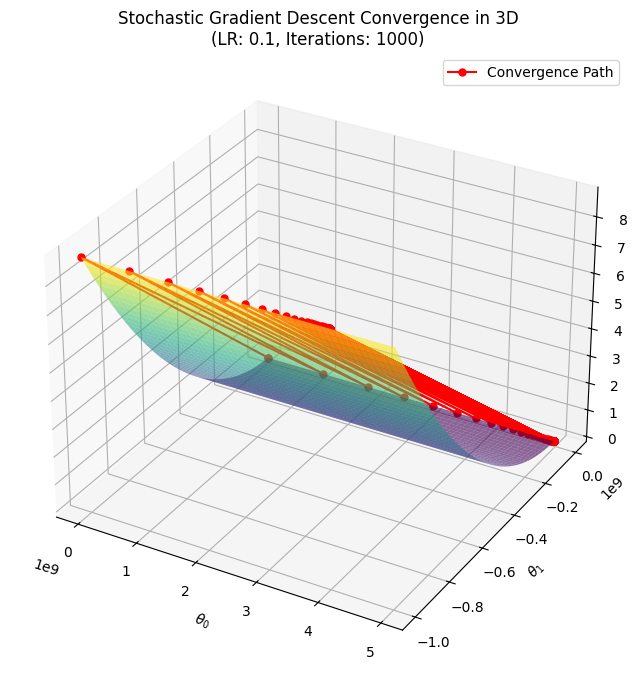

Final theta values for LR: 0.1, Iterations: 1000 -> theta_0: 3977357185.0000, theta_1: -999987385.6000, Loss: 882944969277646897164582912.0000


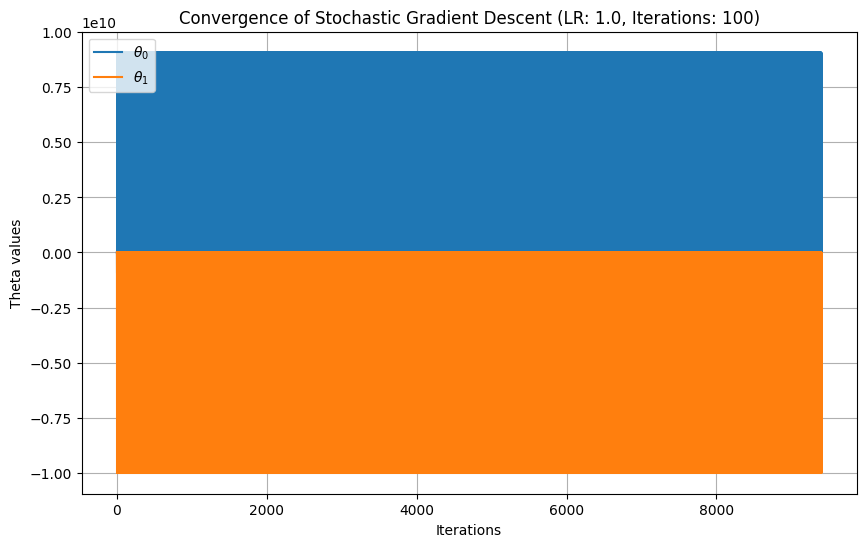

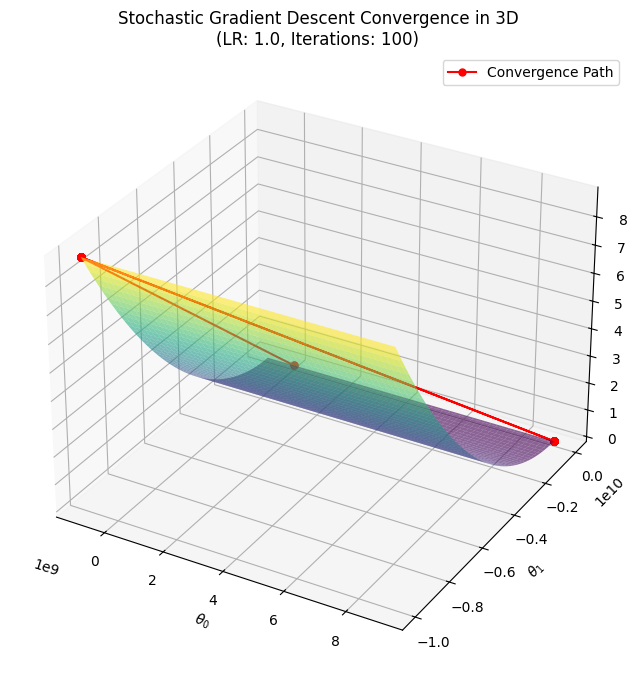

Final theta values for LR: 1.0, Iterations: 100 -> theta_0: -931699590.0000, theta_1: -9999873856.0000, Loss: 88521112884634497941732589568.0000


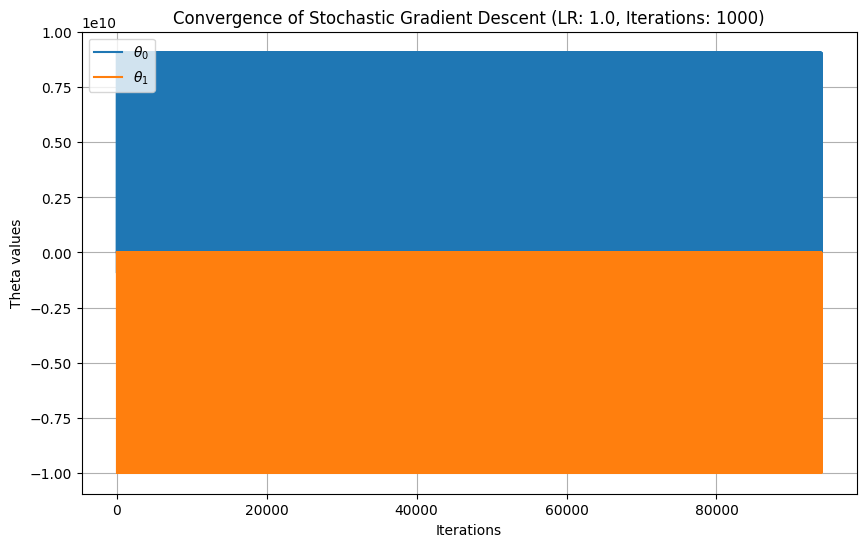

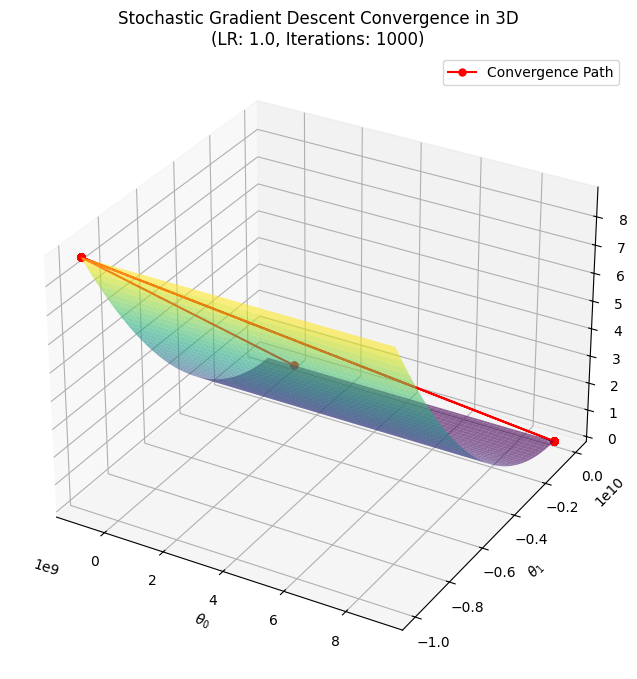

Final theta values for LR: 1.0, Iterations: 1000 -> theta_0: -931699590.0000, theta_1: -9999873856.0000, Loss: 88521112884634497941732589568.0000


In [6]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 3
# Find the minimum of the function L5(theta) = SUM(yi - (theta_0 + theta_1.xi))^2 where i=1 to m
# using Stochastic Gradient Descent method (Take the data from the data file). Choose different
# learning rates and number of iterations

# L5(theta) = SUM(yi - (theta_0 + theta_1.xi))^2 where i=1 to m

# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset using pandas
url = r'https://raw.githubusercontent.com/ManishPraa24/Linear-Regression/main/Data.csv'
data = pd.read_csv(url)

# Extracting X and Y
X = data['x'].values
Y = data['y'].values
m = len(Y)  # number of data points

# Stochastic Gradient of L5(theta) with Gradient Clipping
def L5_stochastic_gradient(theta, X_i, Y_i):
    theta_0, theta_1 = theta
    grad_theta_0 = -2 * (Y_i - (theta_0 + theta_1 * X_i))
    grad_theta_1 = -2 * (Y_i - (theta_0 + theta_1 * X_i)) * X_i
    
    # Gradient clipping to avoid overflow
    grad_theta_0 = np.clip(grad_theta_0, -1e10, 1e10)
    grad_theta_1 = np.clip(grad_theta_1, -1e10, 1e10)
    
    return np.array([grad_theta_0, grad_theta_1])

# Stochastic Gradient Descent Function
def stochastic_gradient_descent(L_stochastic_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        for j in range(m):
            X_i = X[j]
            Y_i = Y[j]
            gradient = L_stochastic_grad(theta, X_i, Y_i)
            theta = theta - learning_rate * gradient
            theta_history.append(theta)

            # Check for overflow or NaN values
            if np.any(np.isnan(theta)) or np.any(np.isinf(theta)):
                print(f"Overflow/NaN encountered at iteration {i}, sample {j} with learning rate {learning_rate}.")
                break

    return theta, theta_history

# Plotting 2D Convergence (Theta values over iterations)
def plot_convergence_2d(theta_history, learning_rate, num_iterations):
    theta_0_history = [theta[0] for theta in theta_history]
    theta_1_history = [theta[1] for theta in theta_history]
    
    plt.figure(figsize=(10, 6))
    
    plt.plot(theta_0_history, label=r'$\theta_0$')
    plt.plot(theta_1_history, label=r'$\theta_1$')
    plt.xlabel('Iterations')
    plt.ylabel('Theta values')
    plt.title(f'Convergence of Stochastic Gradient Descent (LR: {learning_rate}, Iterations: {num_iterations})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotting 3D Convergence with Background Loss Function Surface
def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    theta_0_history = [theta[0] for theta in theta_history]
    theta_1_history = [theta[1] for theta in theta_history]
    
    # Calculate the loss values for the history of thetas
    L_history = [
        np.sum((Y - (theta_0 + theta_1 * X))**2) for theta_0, theta_1 in zip(theta_0_history, theta_1_history)
    ]

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the background surface of the loss function
    theta0_vals = np.linspace(min(theta_0_history), max(theta_0_history), 100)
    theta1_vals = np.linspace(min(theta_1_history), max(theta_1_history), 100)
    theta0_vals, theta1_vals = np.meshgrid(theta0_vals, theta1_vals)
    L_vals = np.array([
        np.sum((Y - (theta0 + theta1 * X))**2)
        for theta0, theta1 in zip(np.ravel(theta0_vals), np.ravel(theta1_vals))
    ])
    L_vals = L_vals.reshape(theta0_vals.shape)
    
    ax.plot_surface(theta0_vals, theta1_vals, L_vals, cmap='viridis', alpha=0.6)

    # Plotting the convergence path
    ax.plot(theta_0_history, theta_1_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel(r'$\theta_0$')
    ax.set_ylabel(r'$\theta_1$')
    ax.set_zlabel(r'$L_5(\theta)$')
    ax.set_title(f'Stochastic Gradient Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()

# Different learning rates and iterations
learning_rates = [0.01, 0.1, 1.0]
iterations = [100, 1000]

# Applying Stochastic Gradient Descent and Plotting Results
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = stochastic_gradient_descent(L5_stochastic_gradient, theta_init, lr, iters)
        
        # 2D Plot
        plot_convergence_2d(theta_history, lr, iters)
        
        # 3D Plot with Background Loss Function
        plot_convergence_3d(theta_history, lr, iters)
        
        # Calculate and display the final loss value
        final_loss = np.sum((Y - (theta_min[0] + theta_min[1] * X))**2)
        print(f'Final theta values for LR: {lr}, Iterations: {iters} -> theta_0: {theta_min[0]:.4f}, theta_1: {theta_min[1]:.4f}, Loss: {final_loss:.4f}')


<h4>
    Conclusion: [Stochastic Gradient Descent Method]
</h4>
<ul> 
    <li>
        For <b>learning rate = 0.01, and iterations = 100</b>, just after few iterations, the gradient descent was on the same latitude of the minima of the function, obtaining a loss value of <b>8581001528207465007546368.00 </b>.
    </li>
    <li>
        For <b>learning rate = 0.01, and iterations = 1000</b>, we got a much finer values of &theta;s with which a loss value of  <b>8580999638986309033263104.00</b> was obtained.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 100</b>, the stochastic gradient descent function immediately led the approach towards minima of function, however obtained a higher loss value of <b>882944969277647309481443328.00</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 1000</b>, the stochastic gradient descent function again, immediately led the approach towards minima of function, obtaining a higher loss value of <b>882944969277646897164582912.00</b> compared to previous cases.
    </li>
    <li>
        For <b>learning rate = 1.0, and the number of iterations = 100</b>, the stochastic gradient descent function's approach path to minima was bouncing to and fro, although it just reached near to minima, with a loss value of <b>88521112884634497941732589568.00</b>.
    </li>
    <li>
        With <b>same learning rate and more number of iterations, i.e., 1000,</b> the Stochastic gradient descent function kept the same approach path for reaching minima, but failed to do so, with same loss value of <b>88521112884634497941732589568.00</b>.
    </li>
    <li>
        From above different cases, the <b>minimum loss value obtained was at learning rate = 0.01, and iterations = 1000 </b>, of value <b>8581001528207465007546368.00 </b>, which even lesser than the one obtained using normal Gradient Descent.
    </li>
</ul>

<br>
<h3>
    Problem - 4 : Find the minima of the following functions using Steepest Descent method.
</h3>
<br>
<h3>
    ( a.) L<sub>1</sub> = &theta;<sup>2</sup>
</h3>
<br>

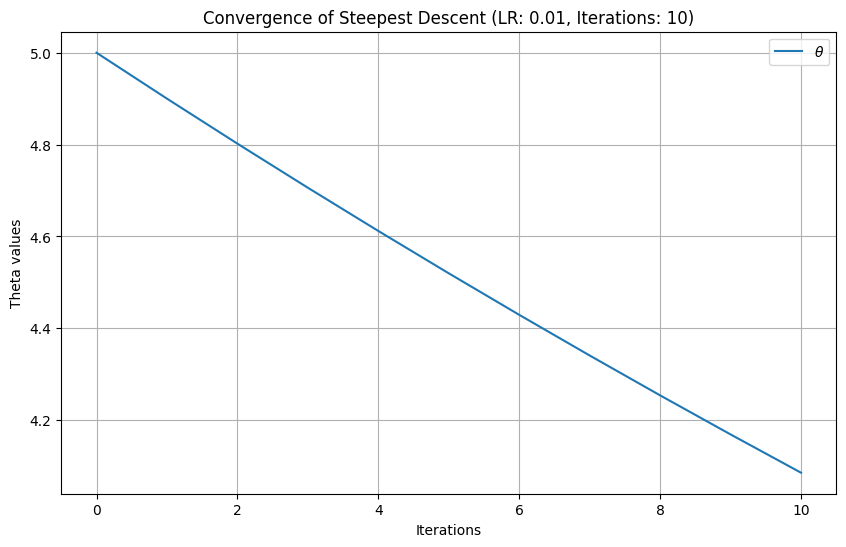

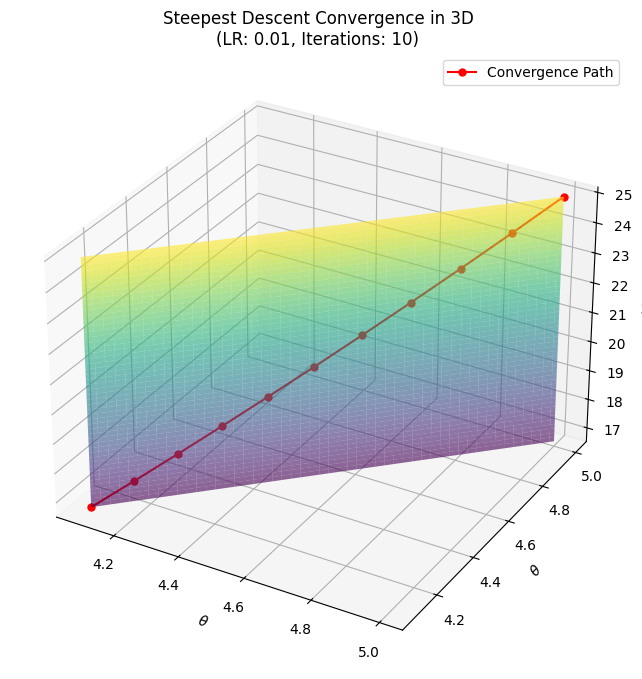

Final theta value for LR: 0.01, Iterations: 10 -> theta: 4.0854, Loss: 16.6902


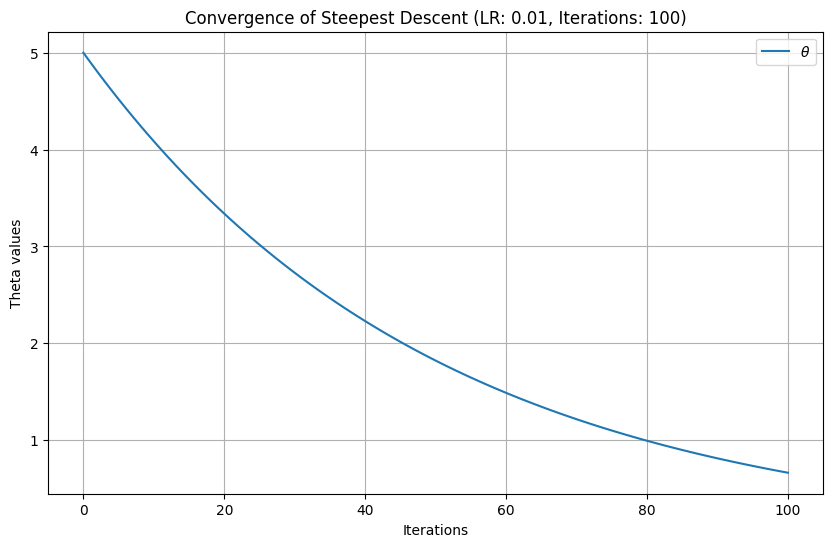

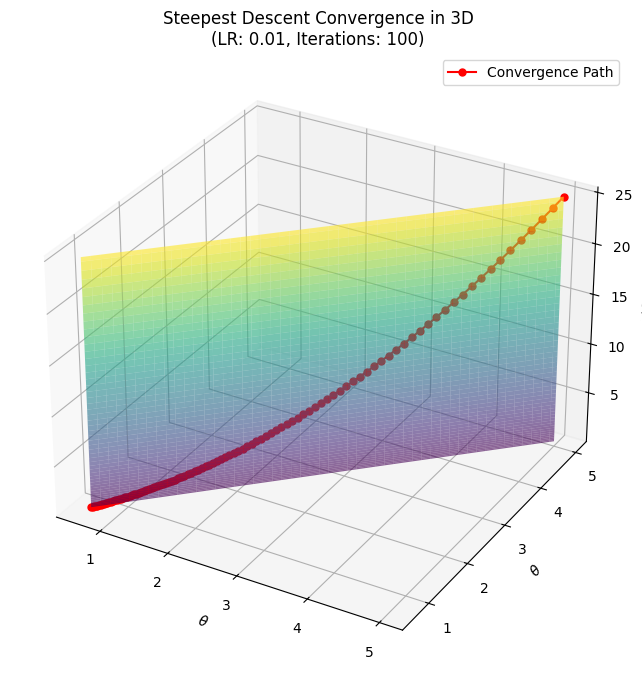

Final theta value for LR: 0.01, Iterations: 100 -> theta: 0.6631, Loss: 0.4397


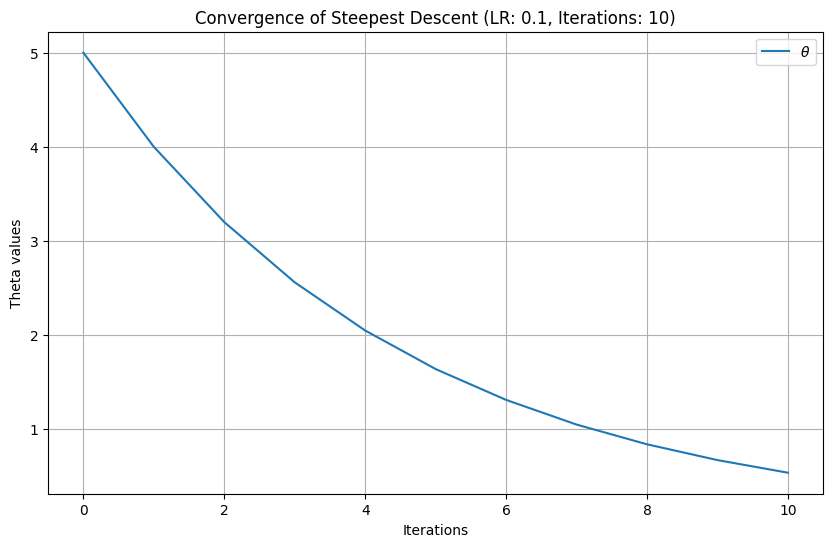

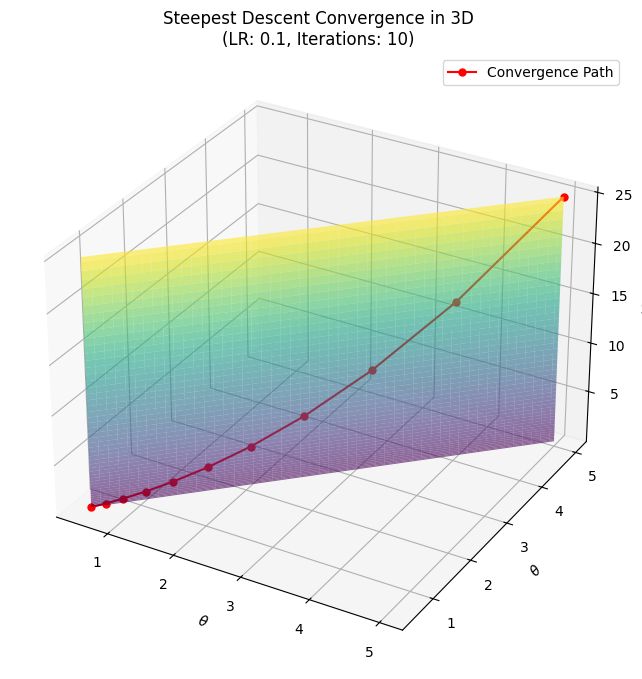

Final theta value for LR: 0.1, Iterations: 10 -> theta: 0.5369, Loss: 0.2882


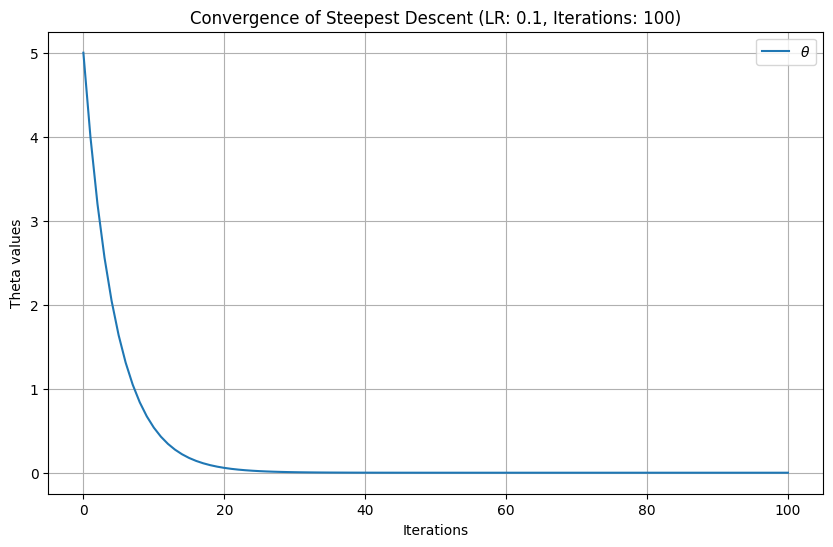

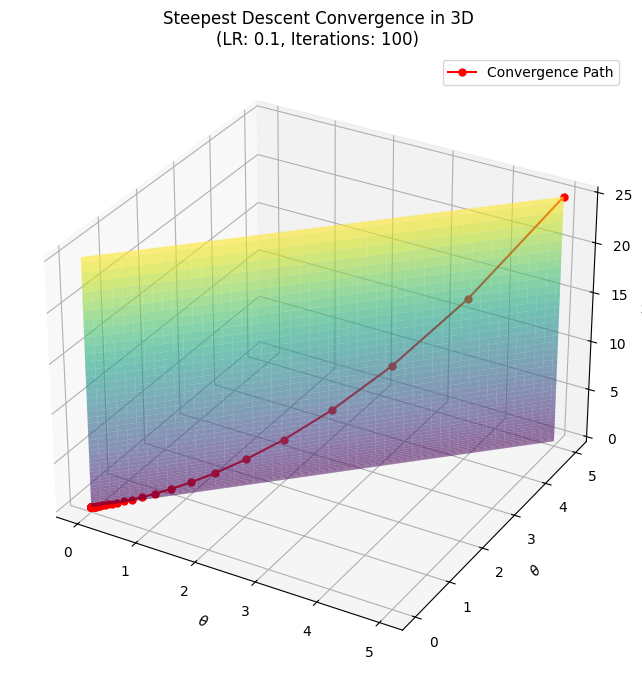

Final theta value for LR: 0.1, Iterations: 100 -> theta: 0.0000, Loss: 0.0000


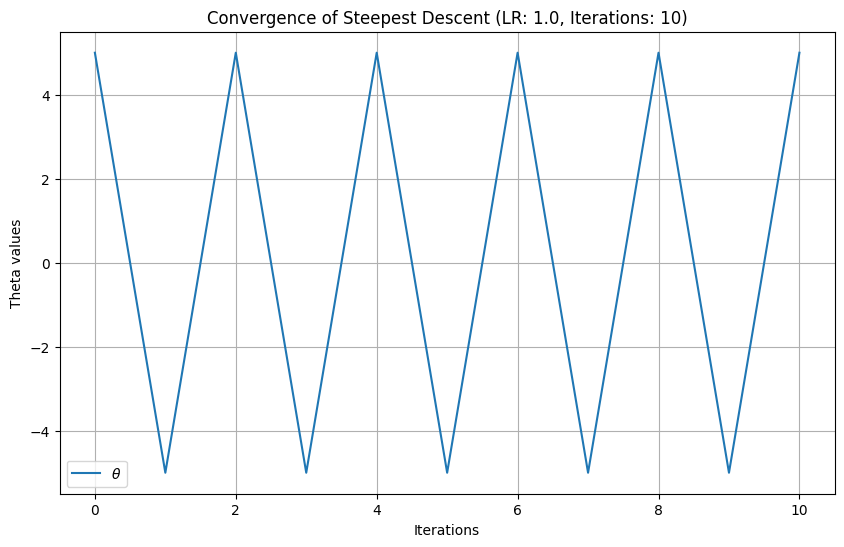

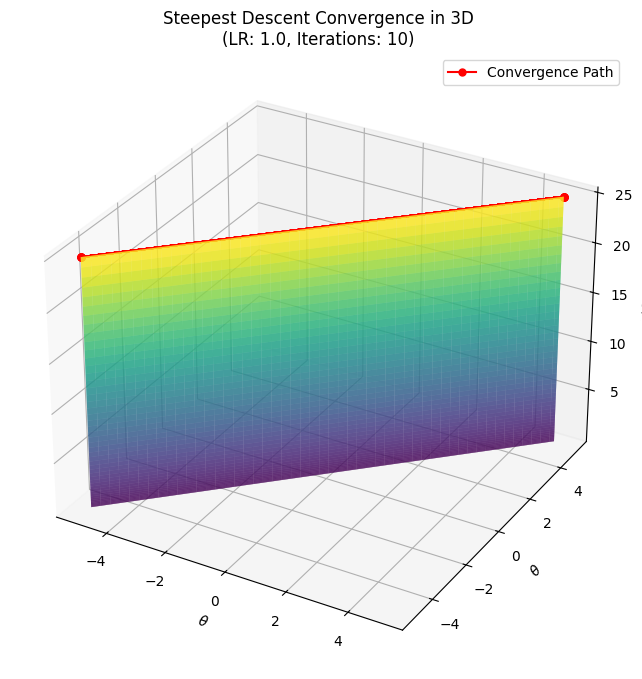

Final theta value for LR: 1.0, Iterations: 10 -> theta: 5.0000, Loss: 25.0000


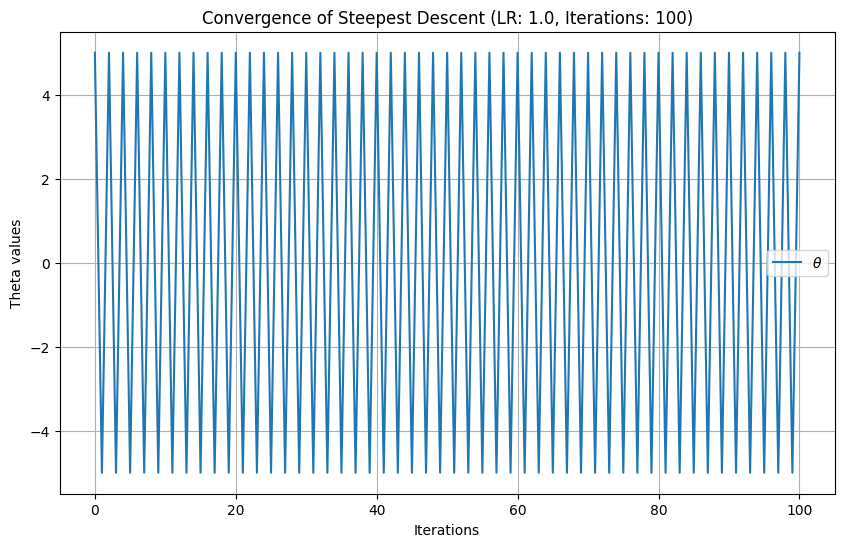

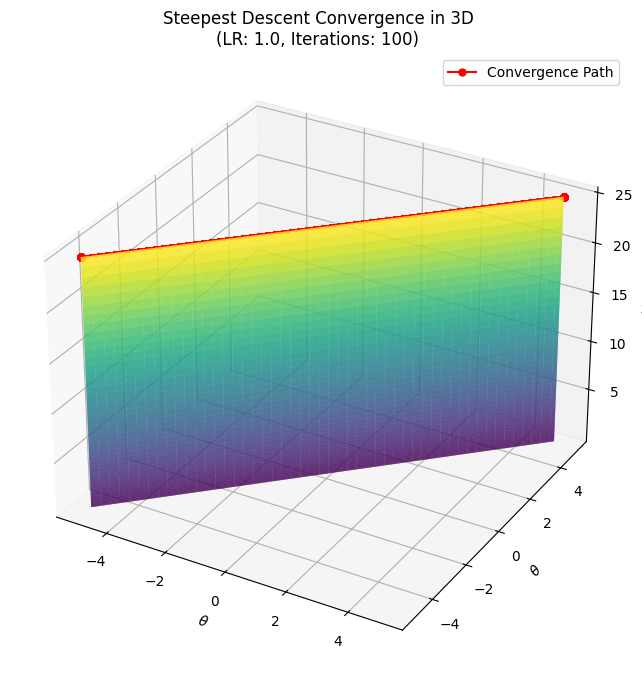

Final theta value for LR: 1.0, Iterations: 100 -> theta: 5.0000, Loss: 25.0000


In [7]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 4
# Find the minima of the following functions
# using Steepest Descent method

# L1(theta) = theta^2

# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt

# Loss Function and its Gradient
def loss_function(theta):
    return theta**2

def loss_gradient(theta):
    return 2 * theta

# Steepest Descent Method
def steepest_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate * gradient
        theta_history.append(theta)

        # Check for overflow or NaN values
        if np.any(np.isnan(theta)) or np.any(np.isinf(theta)):
            print(f"Overflow/NaN encountered at iteration {i} with learning rate {learning_rate}.")
            break

    return theta, theta_history

# Plotting 2D Convergence (Theta values over iterations)
def plot_convergence_2d(theta_history, learning_rate, num_iterations):
    plt.figure(figsize=(10, 6))
    plt.plot(theta_history, label=r'$\theta$')
    plt.xlabel('Iterations')
    plt.ylabel('Theta values')
    plt.title(f'Convergence of Steepest Descent (LR: {learning_rate}, Iterations: {num_iterations})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotting 3D Convergence with Background Loss Function Surface
def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    theta_vals = np.linspace(min(theta_history), max(theta_history), 100)
    L_vals = theta_vals**2
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the background surface of the loss function
    theta_vals_mesh, L_vals_mesh = np.meshgrid(theta_vals, L_vals)
    ax.plot_surface(theta_vals_mesh, theta_vals_mesh, L_vals_mesh, cmap='viridis', alpha=0.6)

    # Plotting the convergence path
    L_history = [loss_function(theta) for theta in theta_history]
    ax.plot(theta_history, theta_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel(r'$\theta$')
    ax.set_ylabel(r'$\theta$')
    ax.set_zlabel(r'$L(\theta)$')
    ax.set_title(f'Steepest Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()

# Initializing theta value
theta_init = 5.0

# Different learning rates and iterations
learning_rates = [0.01, 0.1, 1.0]
iterations = [10, 100]

# Applying Steepest Descent and Plotting Results
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = steepest_descent(loss_gradient, theta_init, lr, iters)
        
        # 2D Plot
        plot_convergence_2d(theta_history, lr, iters)
        
        # 3D Plot with Background Loss Function
        plot_convergence_3d(theta_history, lr, iters)
        
        # Calculate and display the final loss value
        final_loss = loss_function(theta_min)
        print(f'Final theta value for LR: {lr}, Iterations: {iters} -> theta: {theta_min:.4f}, Loss: {final_loss:.4f}')


<h4>
    Conclusion: [Steepest Descent Method] [ Loss function: &theta;<sup>2</sup> ]
</h4>
<ul> 
    <li>
        For <b>learning rate = 0.01, and iterations = 10</b>, got a straight line approach towards the minima, obtaining a loss value of  <b>16.6902</b>.
    </li>
    <li>
        For <b>learning rate = 0.01, and iterations = 100</b>, still got just an optimal &theta; value of 0.6631 with a loss value of <b>0.4397</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 10</b>, got a parabolic path to reach minima, obtaining a loss value of <b>0.2882</b> at <b>&theta;=0.5369</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 100</b>, the steepest gradient descent function finally got the us minimum &theta; value of 0.0, having a loss value of <b>0.0</b>.
    </li>
    <li>
        For <b>learning rate = 1.0, and the number of iterations be 100 or 10</b>, the Steepest gradient descent function's approach path to minima was bouncing to and fro, didn't reach the minima, with a loss value of <b>25.00</b>.
    </li>
</ul>

<br>
<h3>
    ( b.) L<sub>2</sub>(&theta;) = &theta;<sup>2</sup> <sub>1</sub> + &theta;<sup>2</sup> <sub>2</sub>
</h3>
<br>

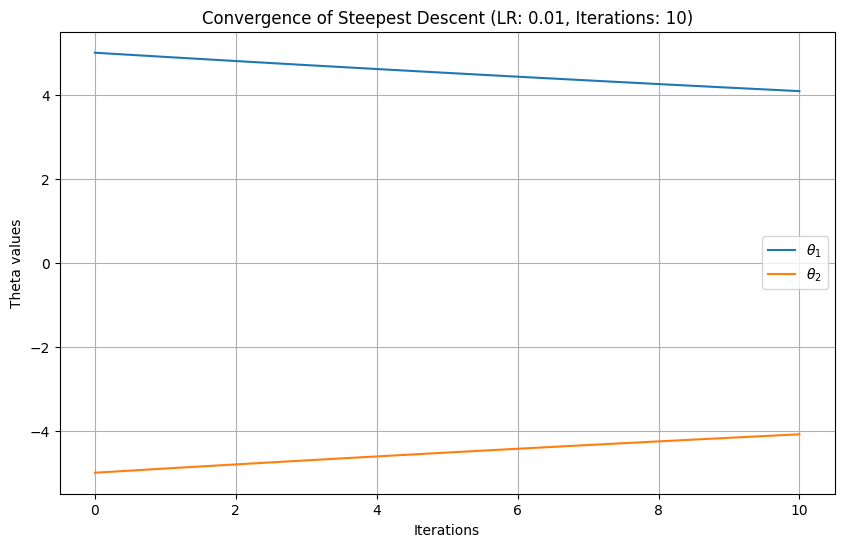

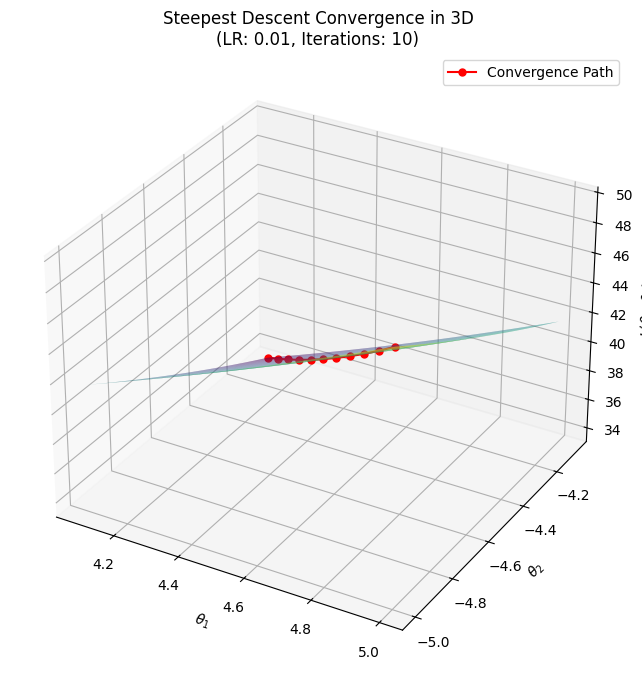

Final theta values for LR: 0.01, Iterations: 10 -> theta_1: 4.0854, theta_2: -4.0854, Loss: 33.3804


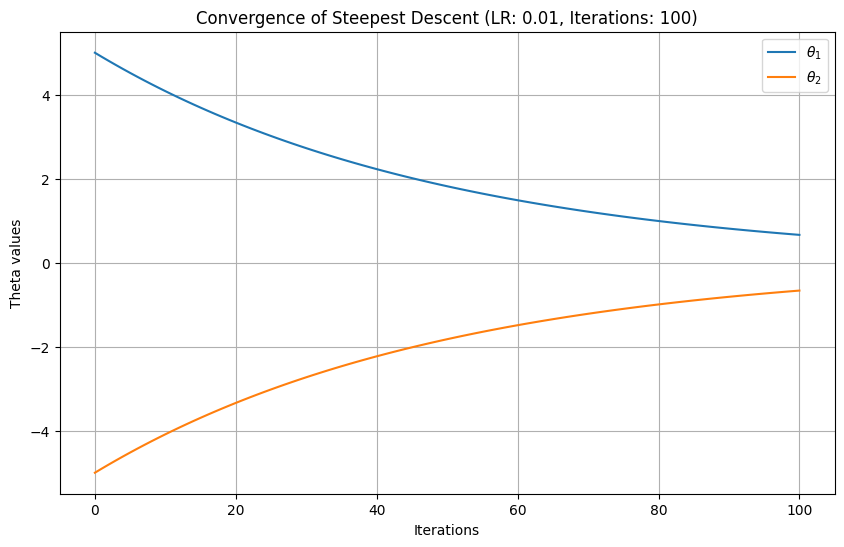

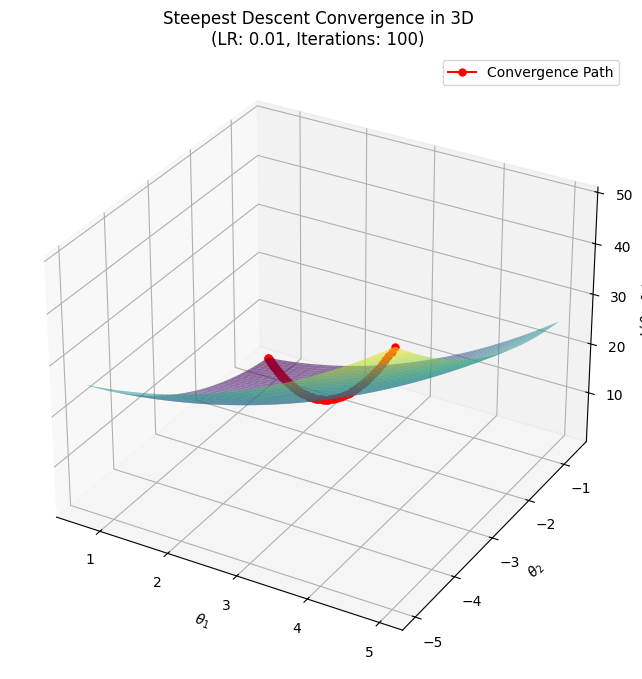

Final theta values for LR: 0.01, Iterations: 100 -> theta_1: 0.6631, theta_2: -0.6631, Loss: 0.8794


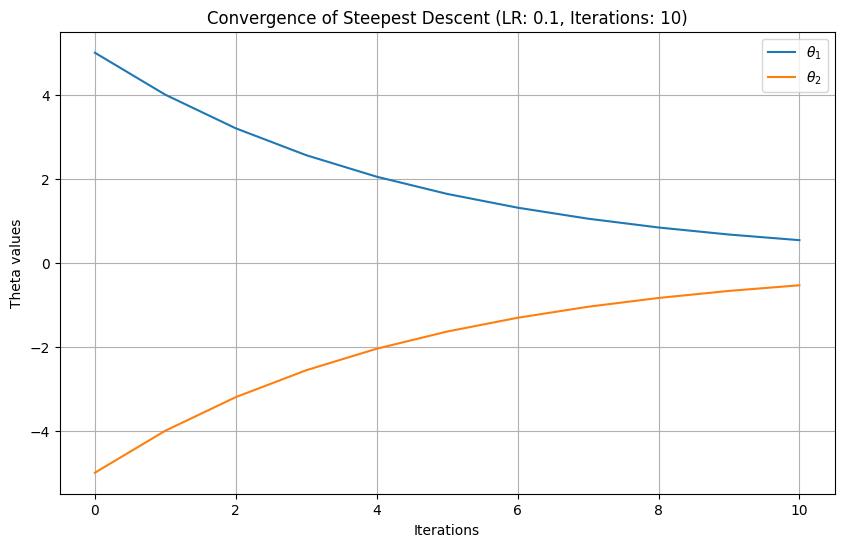

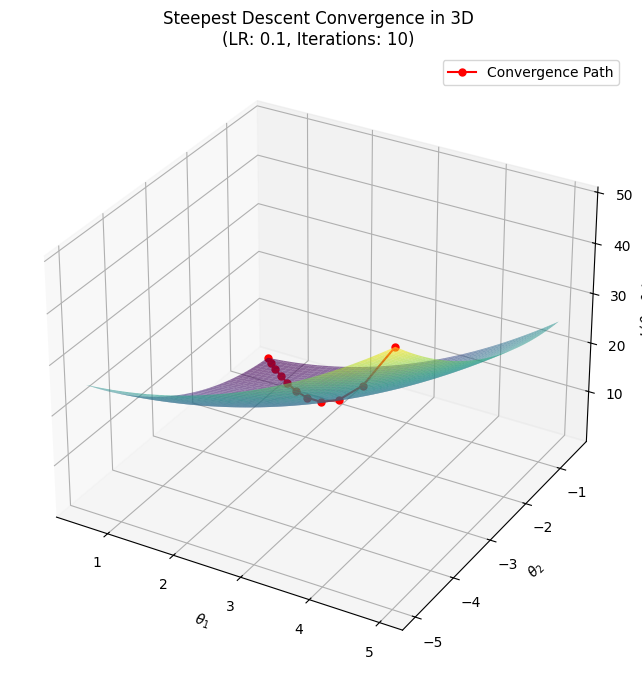

Final theta values for LR: 0.1, Iterations: 10 -> theta_1: 0.5369, theta_2: -0.5369, Loss: 0.5765


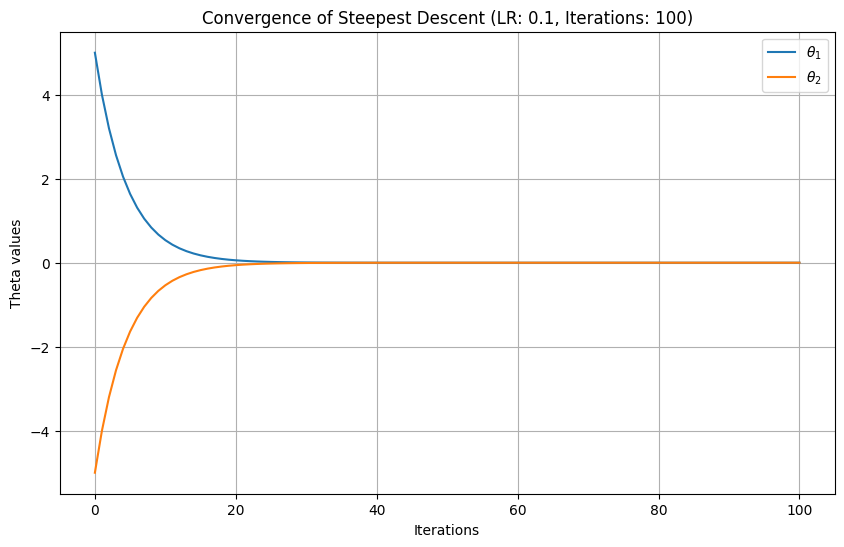

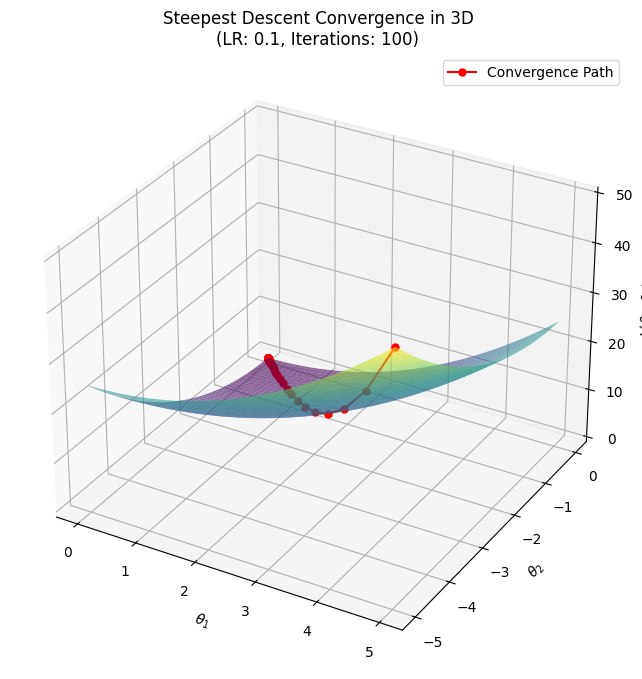

Final theta values for LR: 0.1, Iterations: 100 -> theta_1: 0.0000, theta_2: -0.0000, Loss: 0.0000


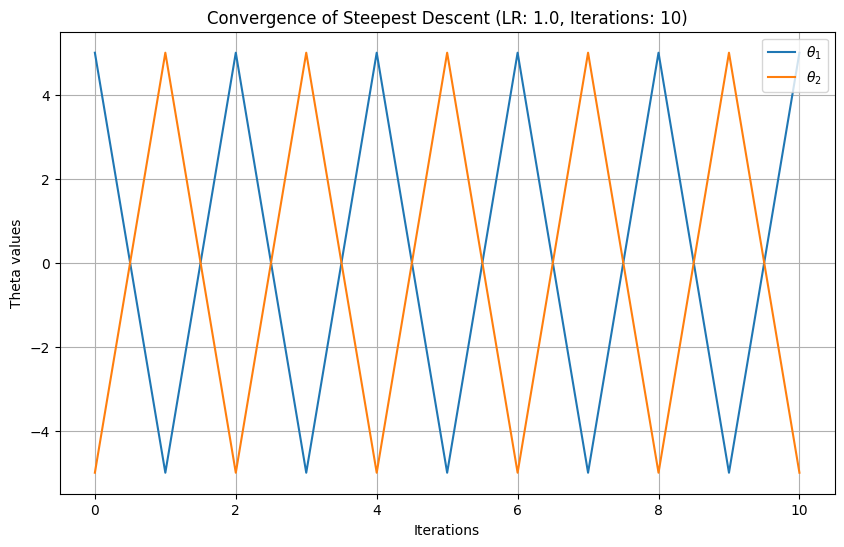

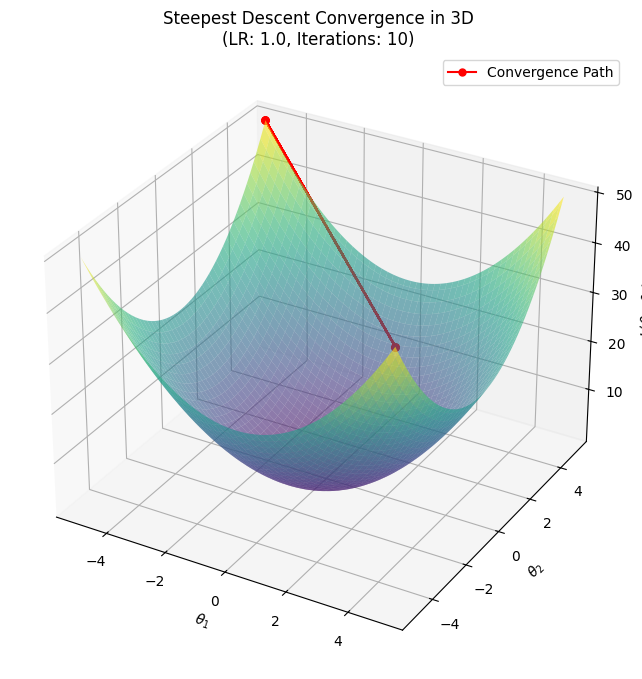

Final theta values for LR: 1.0, Iterations: 10 -> theta_1: 5.0000, theta_2: -5.0000, Loss: 50.0000


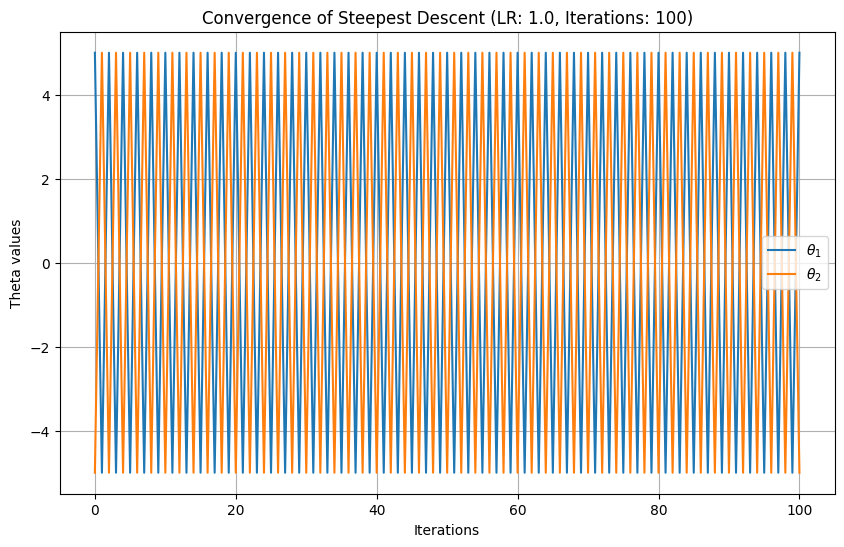

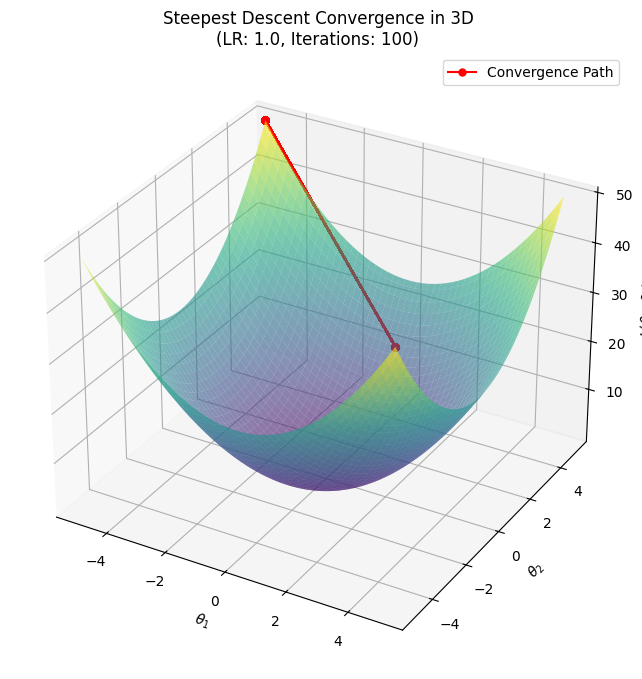

Final theta values for LR: 1.0, Iterations: 100 -> theta_1: 5.0000, theta_2: -5.0000, Loss: 50.0000


In [8]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 4
# Find the minima of the following functions
# using Steepest Descent method

# L2(theta) = theta_1^2 + theta_2^2

# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loss Function and its Gradient
def loss_function(theta):
    theta_1, theta_2 = theta
    return theta_1**2 + theta_2**2

def loss_gradient(theta):
    theta_1, theta_2 = theta
    grad_theta_1 = 2 * theta_1
    grad_theta_2 = 2 * theta_2
    return np.array([grad_theta_1, grad_theta_2])

# Steepest Descent Method
def steepest_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate * gradient
        theta_history.append(theta)

        # Check for overflow or NaN values
        if np.any(np.isnan(theta)) or np.any(np.isinf(theta)):
            print(f"Overflow/NaN encountered at iteration {i} with learning rate {learning_rate}.")
            break

    return theta, theta_history

# Plotting 2D Convergence (Theta values over iterations)
def plot_convergence_2d(theta_history, learning_rate, num_iterations):
    theta_1_history = [theta[0] for theta in theta_history]
    theta_2_history = [theta[1] for theta in theta_history]

    plt.figure(figsize=(10, 6))
    plt.plot(theta_1_history, label=r'$\theta_1$')
    plt.plot(theta_2_history, label=r'$\theta_2$')
    plt.xlabel('Iterations')
    plt.ylabel('Theta values')
    plt.title(f'Convergence of Steepest Descent (LR: {learning_rate}, Iterations: {num_iterations})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotting 3D Convergence with Background Loss Function Surface
def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    theta1_vals = np.linspace(min(theta_history, key=lambda x: x[0])[0], max(theta_history, key=lambda x: x[0])[0], 100)
    theta2_vals = np.linspace(min(theta_history, key=lambda x: x[1])[1], max(theta_history, key=lambda x: x[1])[1], 100)
    theta1_vals, theta2_vals = np.meshgrid(theta1_vals, theta2_vals)
    L_vals = theta1_vals**2 + theta2_vals**2
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the background surface of the loss function
    ax.plot_surface(theta1_vals, theta2_vals, L_vals, cmap='viridis', alpha=0.6)

    # Plotting the convergence path
    L_history = [loss_function(theta) for theta in theta_history]
    theta_1_history = [theta[0] for theta in theta_history]
    theta_2_history = [theta[1] for theta in theta_history]
    ax.plot(theta_1_history, theta_2_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel(r'$\theta_1$')
    ax.set_ylabel(r'$\theta_2$')
    ax.set_zlabel(r'$L(\theta_1, \theta_2)$')
    ax.set_title(f'Steepest Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()

# Initializing theta values (theta_1, theta_2)
theta_init = np.array([5.0, -5.0])

# Different learning rates and iterations
learning_rates = [0.01, 0.1, 1.0]
iterations = [10, 100]

# Applying Steepest Descent and Plotting Results
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = steepest_descent(loss_gradient, theta_init, lr, iters)
        
        # 2D Plot
        plot_convergence_2d(theta_history, lr, iters)
        
        # 3D Plot with Background Loss Function
        plot_convergence_3d(theta_history, lr, iters)
        
        # Calculate and display the final loss value
        final_loss = loss_function(theta_min)
        print(f'Final theta values for LR: {lr}, Iterations: {iters} -> theta_1: {theta_min[0]:.4f}, theta_2: {theta_min[1]:.4f}, Loss: {final_loss:.4f}')


<h4>
    Conclusion: [Steepest Descent Method] [ Loss function: &theta;<sup>2</sup> <sub>1</sub> + &theta;<sup>2</sup> <sub>2</sub> ]
</h4>
<ul> 
    <li>
        For <b>learning rate = 0.01, and iterations = 10</b>, got a straight line approach towards the minima, obtaining a loss value of  <b>33.3804</b>.
    </li>
    <li>
        For <b>learning rate = 0.01, and iterations = 100</b>, the path started converging towards the minima, obtaining a loss value of  <b>0.8794</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 10</b>, got a parabolic path to reach minima, obtaining a loss value of <b>0.5765</b> at <b>&theta;<sub>1</sub>=0.5369</b> and <b>&theta;<sub>2</sub>= -0.5369</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 100</b>, the steepest gradient descent function finally got the us minimum &theta; values of both being 0.0, having a loss value of <b>0.0</b>.
    </li>
    <li>
        For <b>learning rate = 1.0, and the number of iterations be 100 or 10</b>, the Steepest gradient descent function's approach path to minima was bouncing to and fro, didn't reach the minima, obtaining a loss value of <b>50.00</b>.
    </li>
</ul>

<br>
<h3>
    ( c.) L<sub>3</sub>(&theta;) = (&theta; - 1)<sup>2</sup>
</h3>
<br>

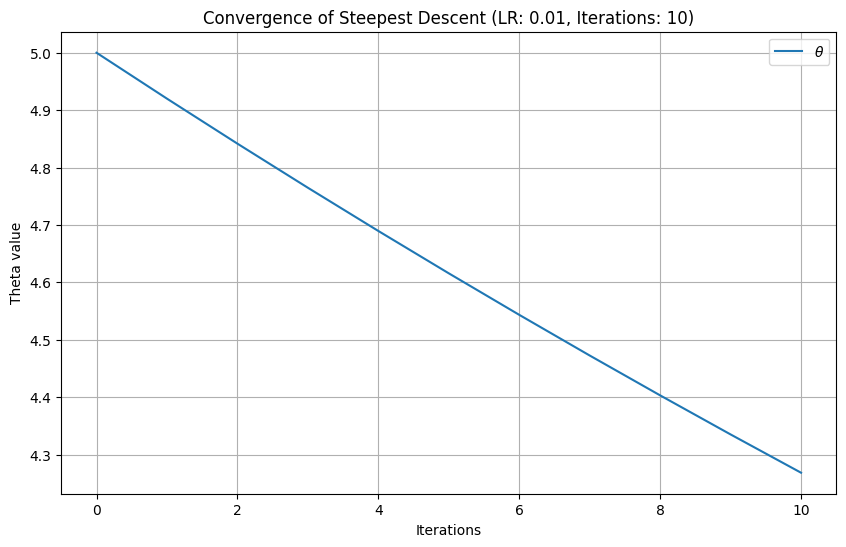

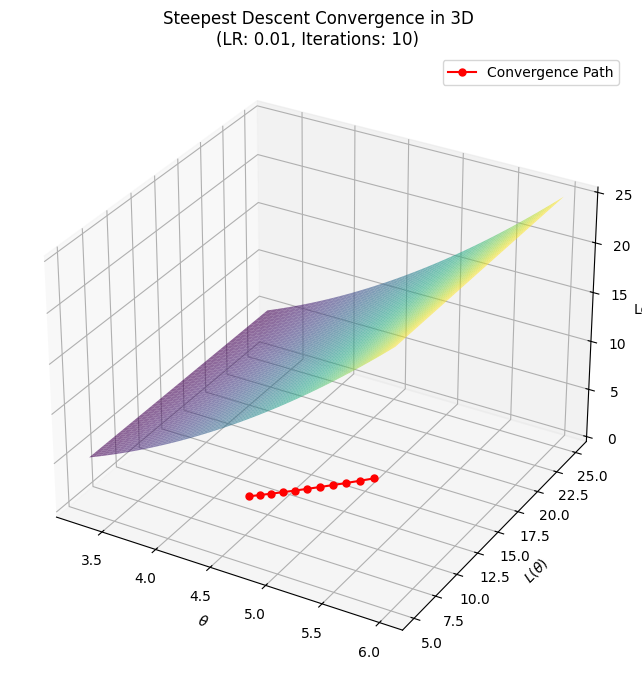

Final theta value for LR: 0.01, Iterations: 10 -> theta: 4.2683, Loss: 10.6817


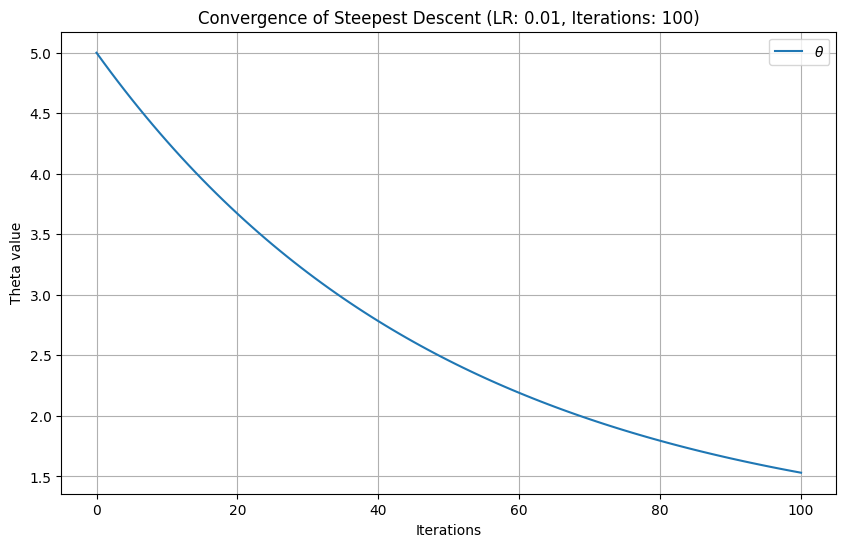

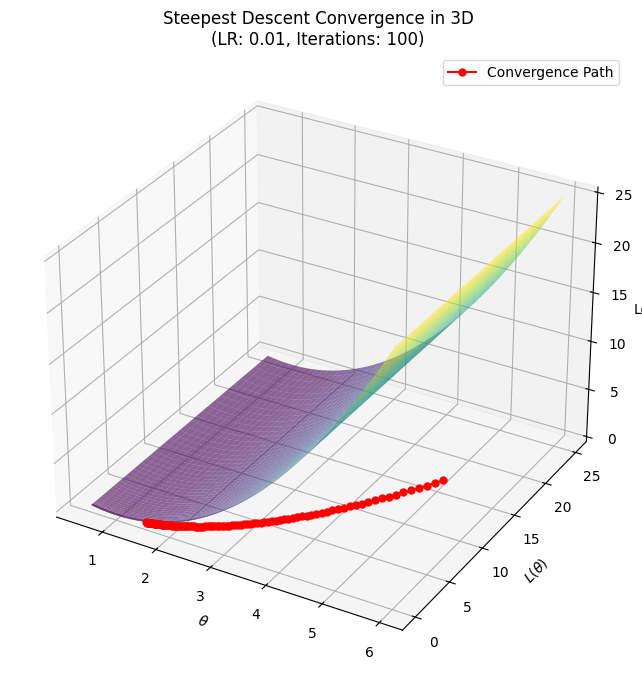

Final theta value for LR: 0.01, Iterations: 100 -> theta: 1.5305, Loss: 0.2814


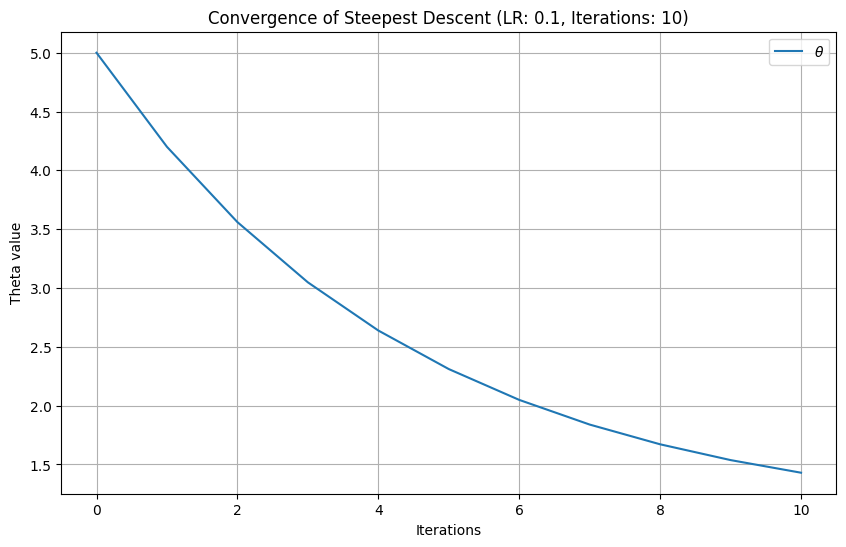

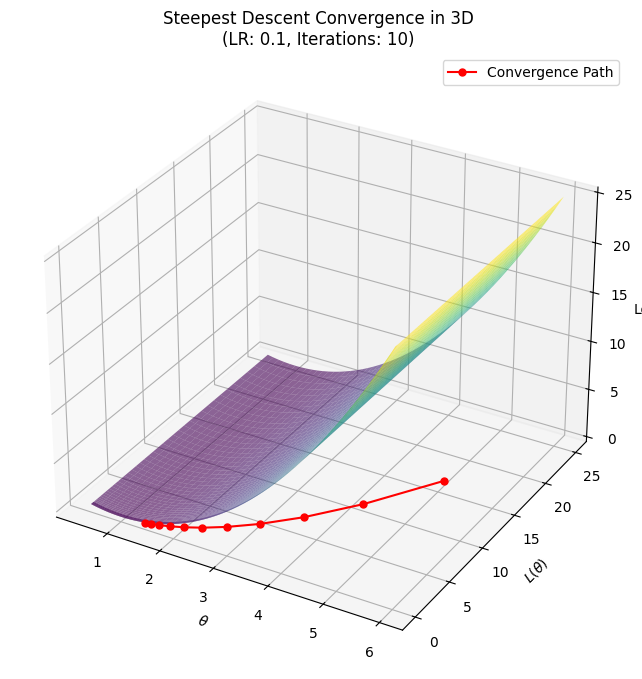

Final theta value for LR: 0.1, Iterations: 10 -> theta: 1.4295, Loss: 0.1845


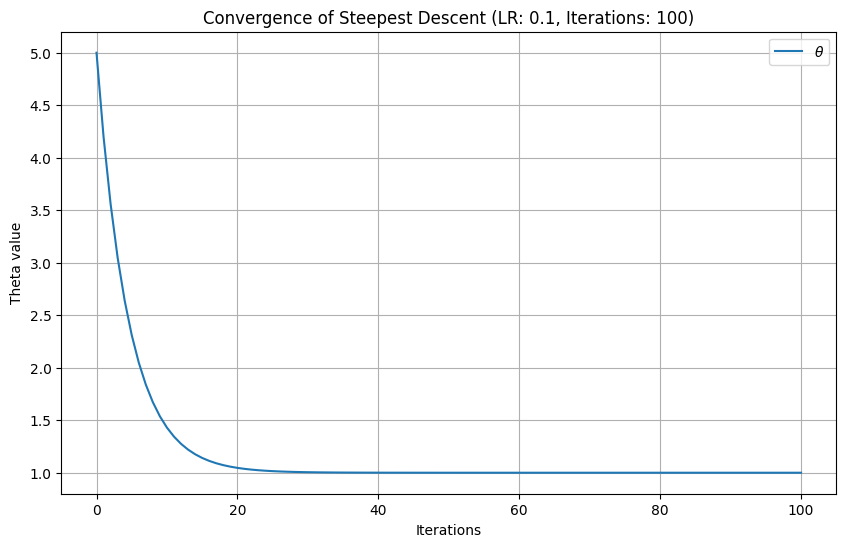

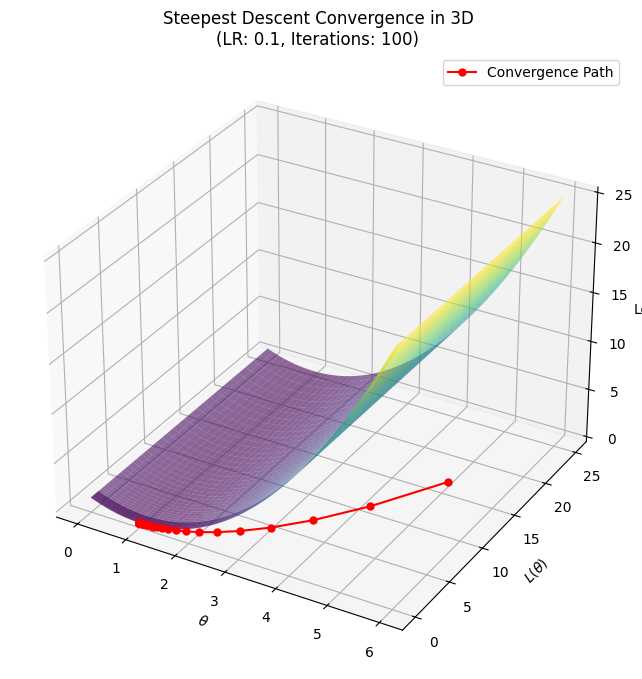

Final theta value for LR: 0.1, Iterations: 100 -> theta: 1.0000, Loss: 0.0000


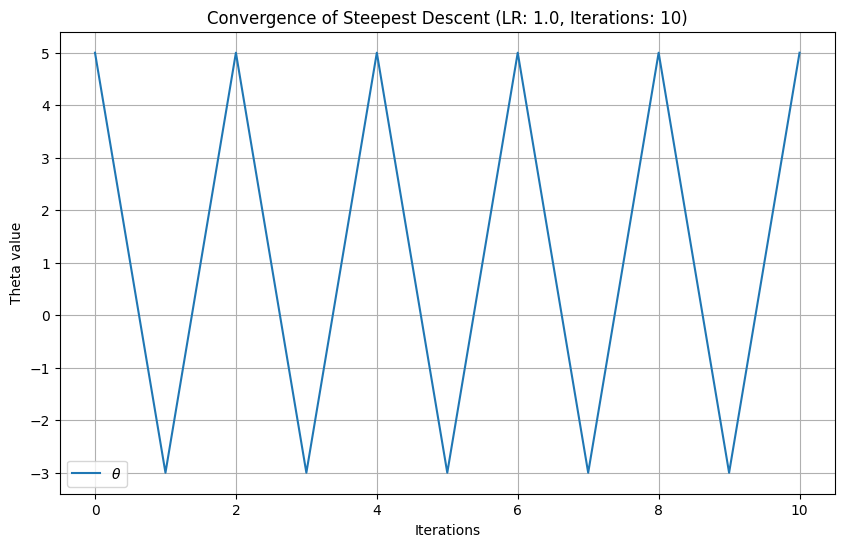

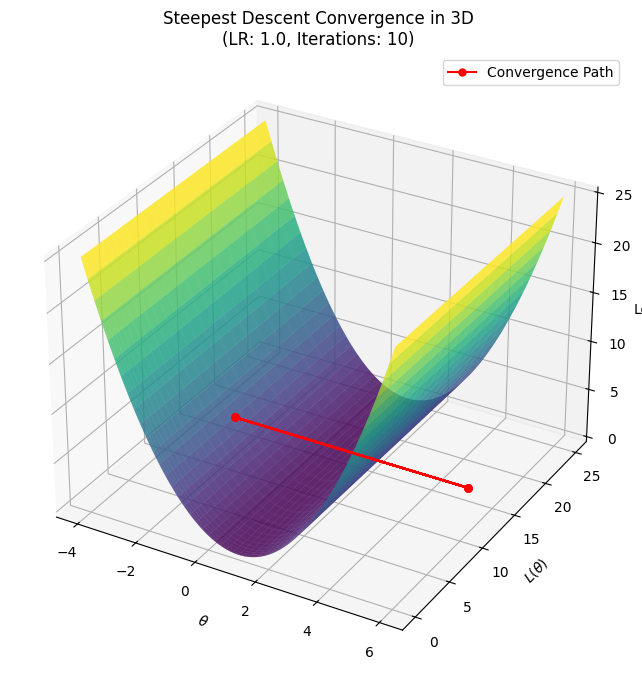

Final theta value for LR: 1.0, Iterations: 10 -> theta: 5.0000, Loss: 16.0000


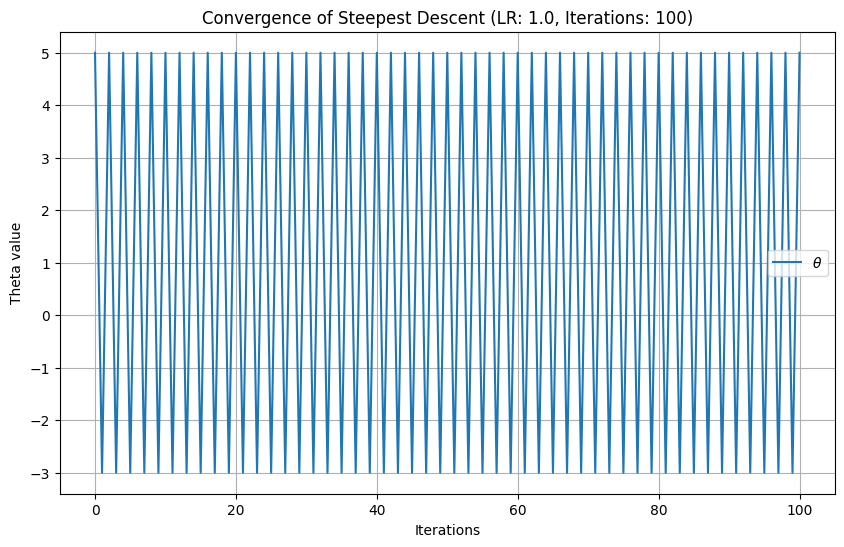

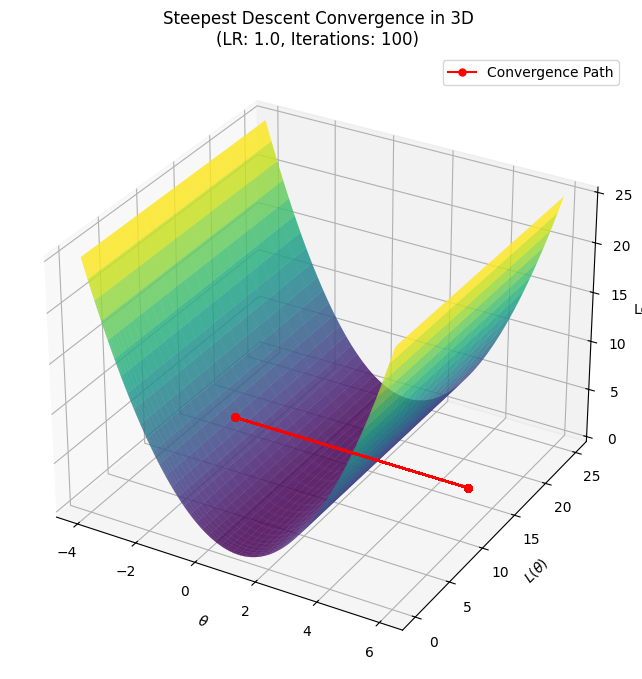

Final theta value for LR: 1.0, Iterations: 100 -> theta: 5.0000, Loss: 16.0000


In [9]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 4
# Find the minima of the following functions
# using Steepest Descent method

# L3(theta) = (theta-1)^2

# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt

# Loss Function and its Gradient
def loss_function(theta):
    return (theta - 1) ** 2

def loss_gradient(theta):
    return 2 * (theta - 1)

# Steepest Descent Method
def steepest_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate * gradient
        theta_history.append(theta)

        # Check for overflow or NaN values
        if np.any(np.isnan(theta)) or np.any(np.isinf(theta)):
            print(f"Overflow/NaN encountered at iteration {i} with learning rate {learning_rate}.")
            break

    return theta, theta_history

# Plotting 2D Convergence (Theta values over iterations)
def plot_convergence_2d(theta_history, learning_rate, num_iterations):
    plt.figure(figsize=(10, 6))
    plt.plot(theta_history, label=r'$\theta$')
    plt.xlabel('Iterations')
    plt.ylabel('Theta value')
    plt.title(f'Convergence of Steepest Descent (LR: {learning_rate}, Iterations: {num_iterations})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plotting 3D Convergence with Full Background Loss Function Surface
def plot_convergence_3d_with_surface(theta_history, learning_rate, num_iterations):
    # Prepare the theta values and corresponding loss values
    theta_vals = np.linspace(min(theta_history) - 1, max(theta_history) + 1, 400)
    L_vals = loss_function(theta_vals)
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Create a meshgrid for 3D plotting
    theta_vals_mesh = np.meshgrid(theta_vals)
    L_vals_mesh = np.meshgrid(L_vals)
    
    # Plotting the full surface of the loss function
    theta_vals_grid, L_vals_grid = np.meshgrid(theta_vals, L_vals)
    loss_grid = (theta_vals_grid - 1) ** 2
    ax.plot_surface(theta_vals_grid, L_vals_grid, loss_grid, cmap='viridis', alpha=0.6, edgecolor='none')

    # Plotting the convergence path
    L_history = [loss_function(theta) for theta in theta_history]
    ax.plot(theta_history, L_history, 0, color='red', marker='o', markersize=5, label='Convergence Path', zorder=5)

    ax.set_xlabel(r'$\theta$')
    ax.set_ylabel(r'$L(\theta)$')
    ax.set_zlabel('Loss')
    ax.set_title(f'Steepest Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()

# Initializing theta value
theta_init = 5.0

# Different learning rates and iterations
learning_rates = [0.01, 0.1, 1.0]
iterations = [10, 100]

# Applying Steepest Descent and Plotting Results
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = steepest_descent(loss_gradient, theta_init, lr, iters)
        
        # 2D Plot
        plot_convergence_2d(theta_history, lr, iters)
        
        # 3D Plot with Background Loss Function
        plot_convergence_3d_with_surface(theta_history, lr, iters)
        
        # Calculate and display the final loss value
        final_loss = loss_function(theta_min)
        print(f'Final theta value for LR: {lr}, Iterations: {iters} -> theta: {theta_min:.4f}, Loss: {final_loss:.4f}')


<h4>
    Conclusion: [Steepest Descent Method] [ Loss function: (&theta; - 1)<sup>2</sup> ]
</h4>
<ul> 
    <li>
        For <b>learning rate = 0.01, and iterations = 10</b>, got a straight line approach towards the minima, obtaining a loss value of  <b>10.6817</b>.
    </li>
    <li>
        For <b>learning rate = 0.01, and iterations = 100</b>, a converging path towards the minima was discovered, obtaining a loss value of  <b>0.2814</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 10</b>, got a parabolic path to reach minima, obtaining a loss value of <b>0.1845</b> at <b>&theta; = 1.4295</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 100</b>, the steepest gradient descent function finally got the us minimum &theta; value of 0.0, having a loss value of <b>0.0</b>.
    </li>
    <li>
        For <b>learning rate = 1.0, and the number of iterations be 100 or 10</b>, the Steepest gradient descent function's approach path to minima was bouncing to and fro, didn't reach the minima, obtaining a loss value of <b>16.00</b>.
    </li>
</ul>

<br>
<h3>
    ( d.) L<sub>4</sub>(&theta;) = 2(&theta;<sub>1</sub> - 1)<sup>2</sup> + 2(&theta;<sub>2</sub> - 1)<sup>2</sup>
</h3>
<br>

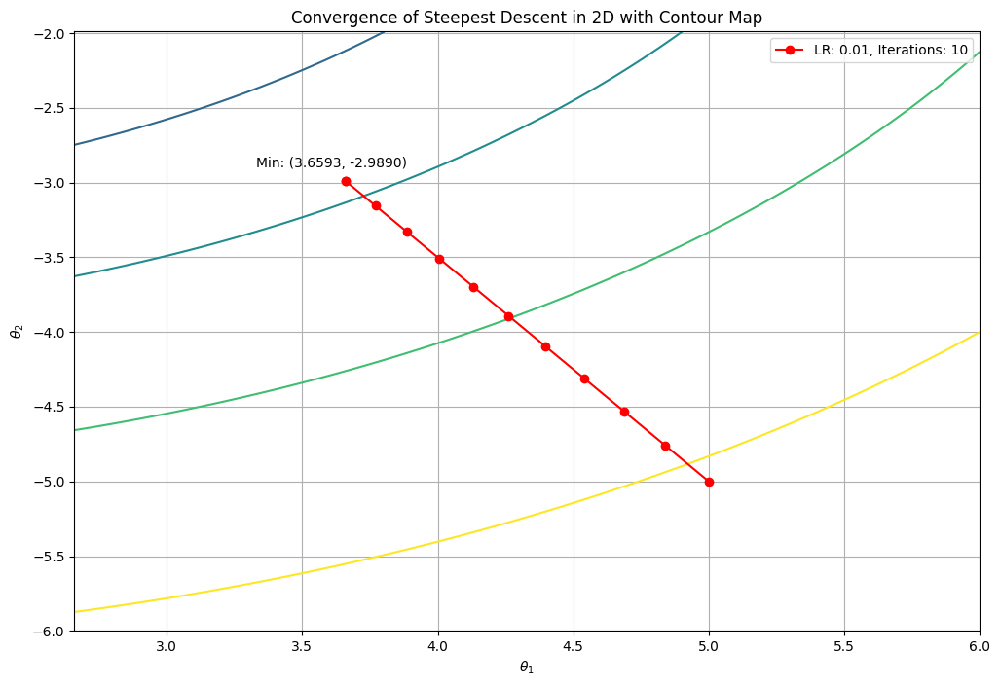

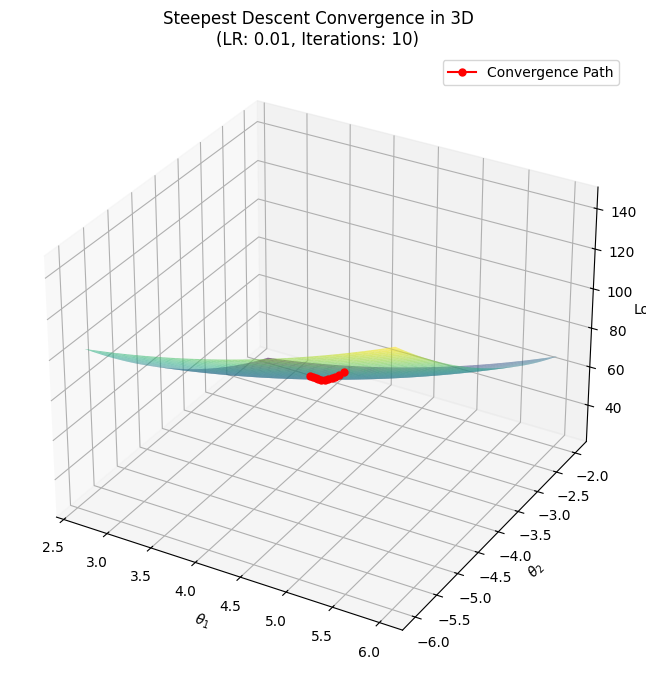

Final theta values for LR: 0.01, Iterations: 10 -> theta: 3.659330543966005, -2.988995815949006, Loss: 45.9683


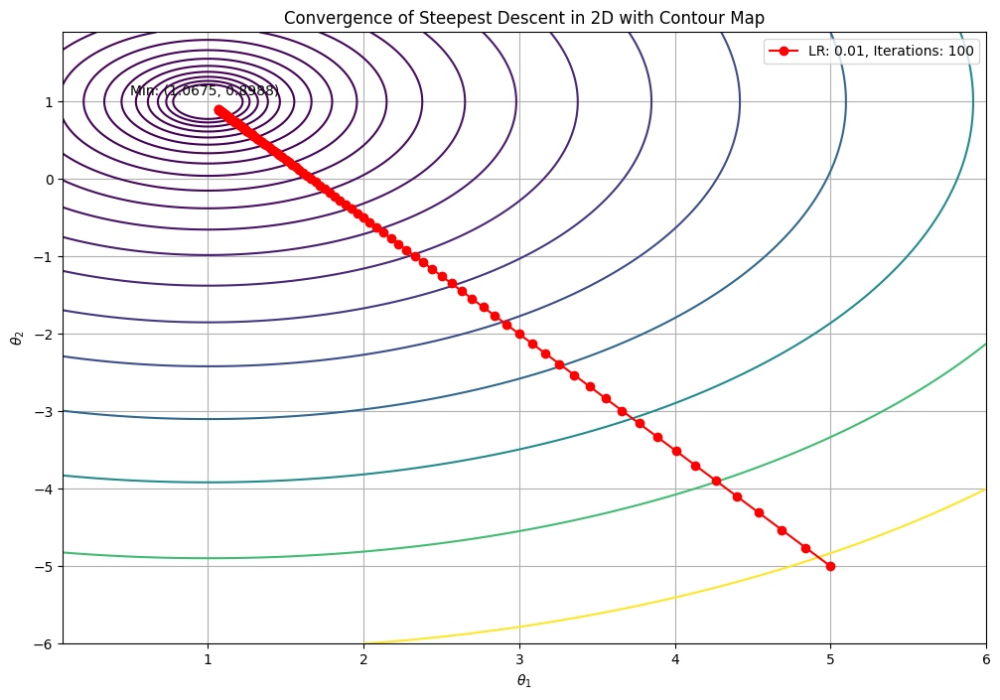

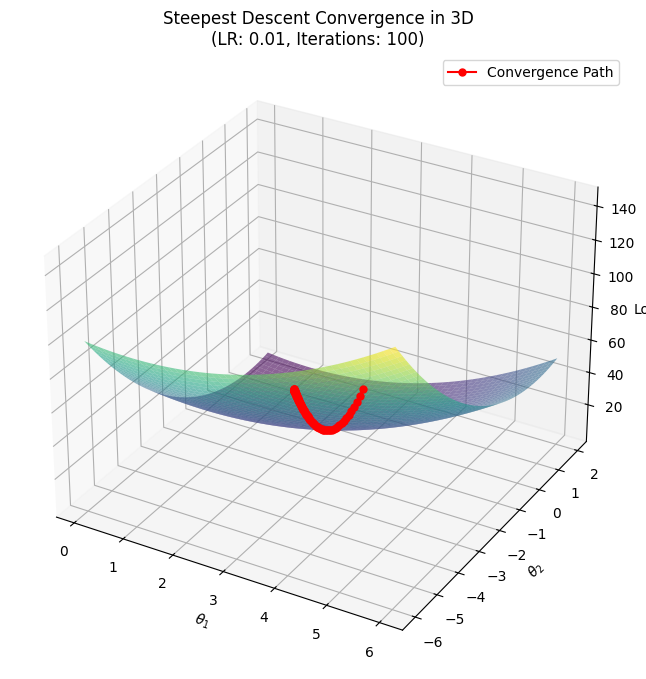

Final theta values for LR: 0.01, Iterations: 100 -> theta: 1.0674812774353986, 0.898778083846902, Loss: 0.0296


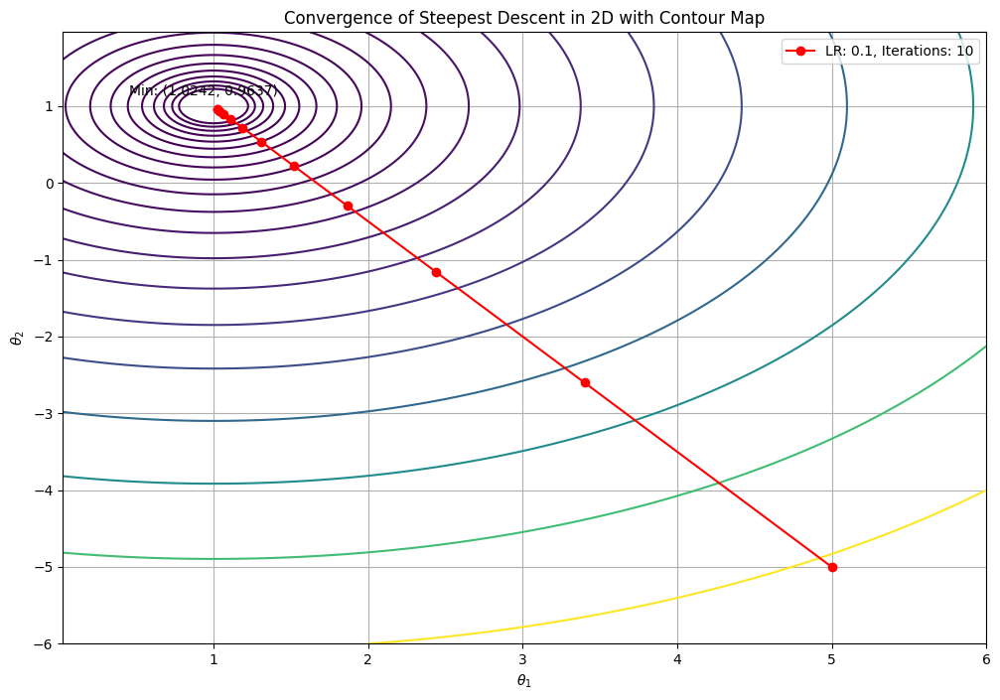

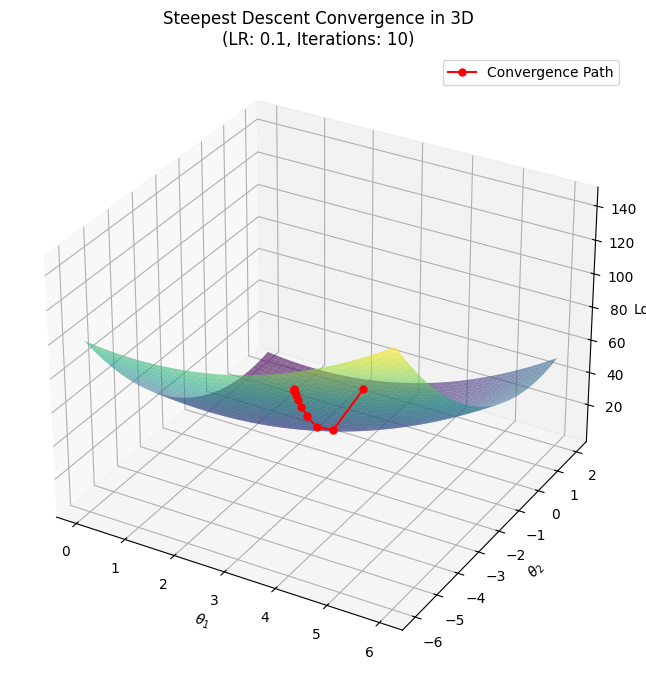

Final theta values for LR: 0.1, Iterations: 10 -> theta: 1.0241864704, 0.9637202944000001, Loss: 0.0038


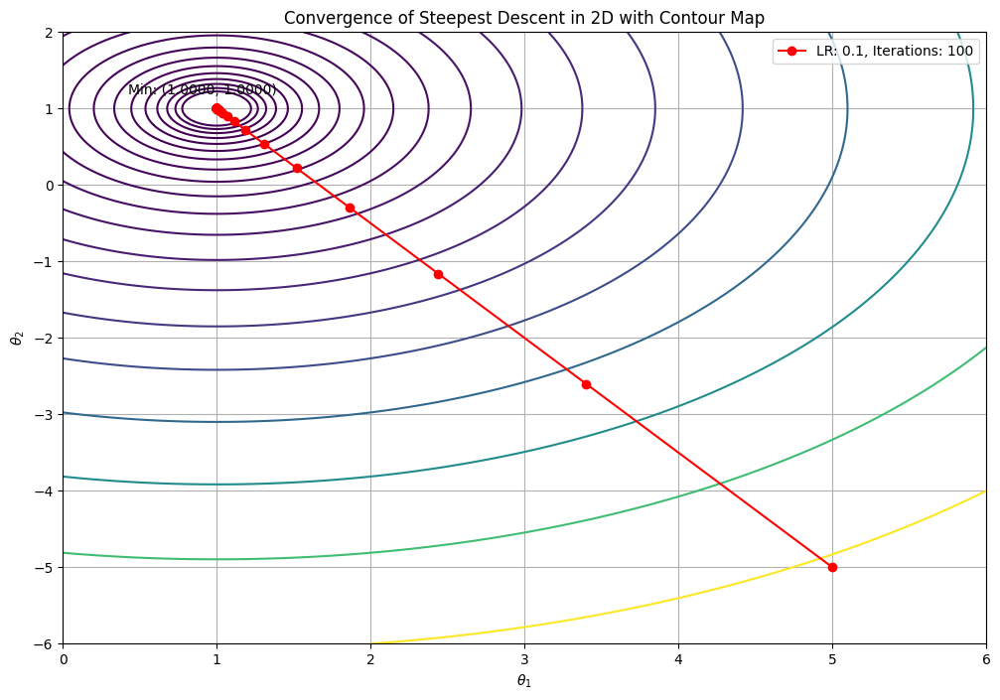

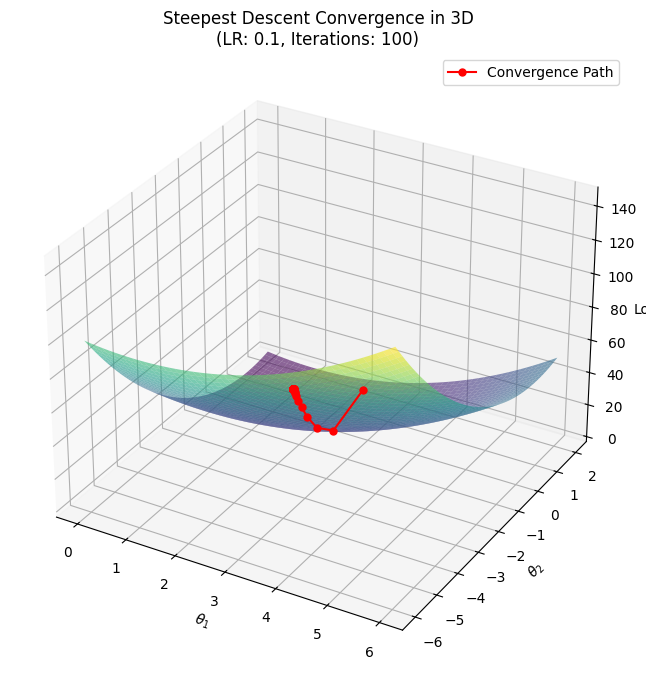

Final theta values for LR: 0.1, Iterations: 100 -> theta: 1.0000000000000002, 0.9999999999999999, Loss: 0.0000


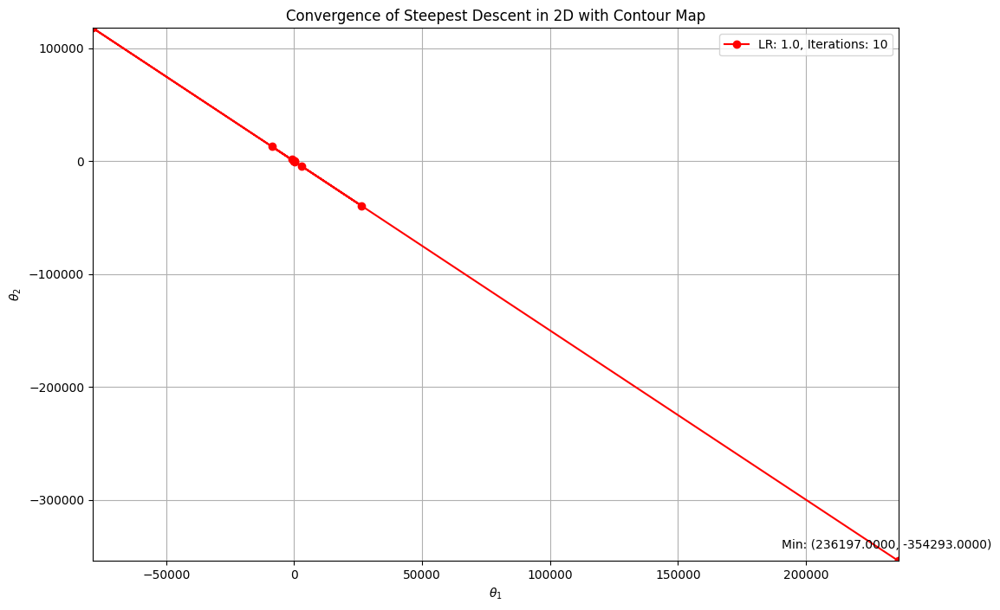

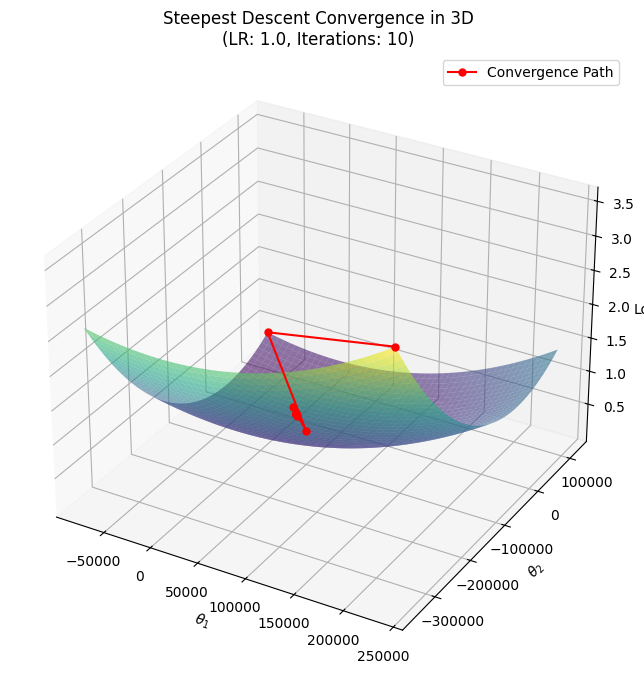

Final theta values for LR: 1.0, Iterations: 10 -> theta: 236197.0, -354293.0, Loss: 362625577704.0000


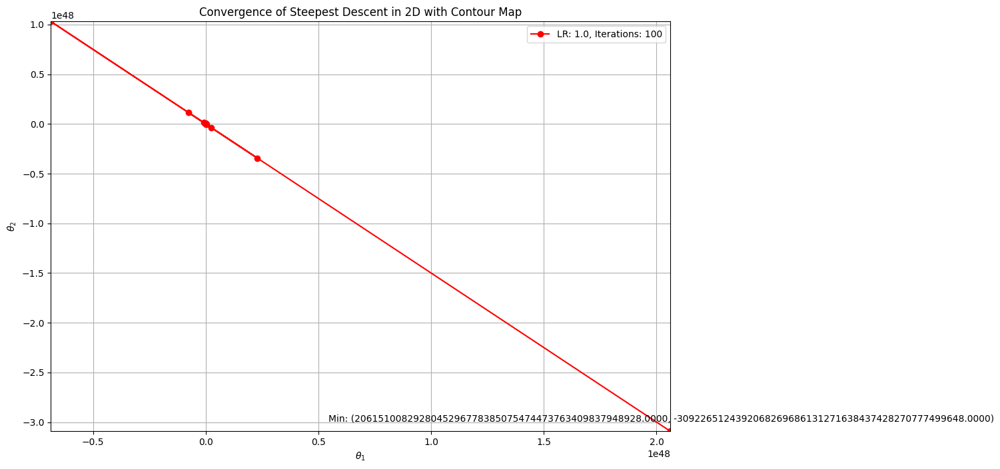

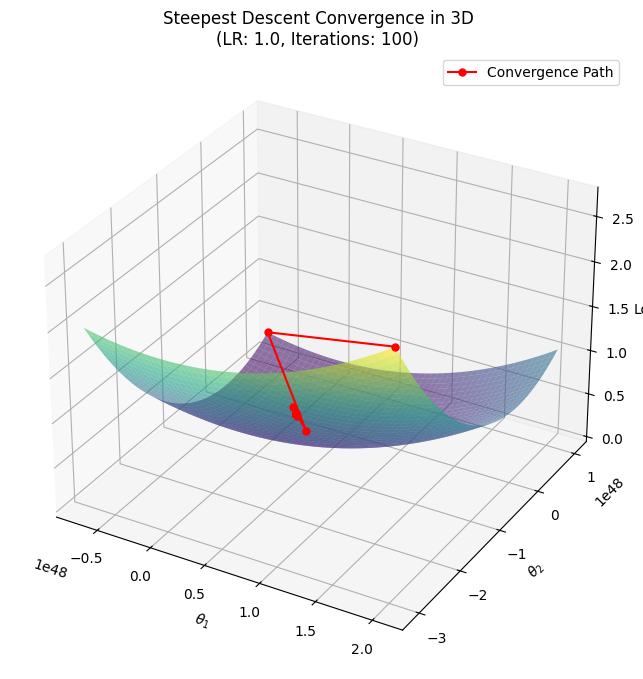

Final theta values for LR: 1.0, Iterations: 100 -> theta: 2.0615100829280453e+48, -3.092265124392068e+48, Loss: 27623854843090978367966477343817689665025986043556479416980244671064588035982343329423436952895488.0000


In [10]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 4
# Find the minima of the following functions
# using Steepest Descent method

# L4(theta) = 2(theta_1 - 1)^2 + 2(theta_2 - 1)^2

# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt

# Loss Function and its Gradient
def loss_function(theta):
    theta_1, theta_2 = theta
    return 2 * (theta_1 - 1) ** 2 + 2 * (theta_2 - 1) ** 2

def loss_gradient(theta):
    theta_1, theta_2 = theta
    grad_theta_1 = 4 * (theta_1 - 1)
    grad_theta_2 = 4 * (theta_2 - 1)
    return np.array([grad_theta_1, grad_theta_2])

# Steepest Descent Method
def steepest_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate * gradient
        theta_history.append(theta)

        # Check for overflow or NaN values
        if np.any(np.isnan(theta)) or np.any(np.isinf(theta)):
            print(f"Overflow/NaN encountered at iteration {i} with learning rate {learning_rate}.")
            break

    return theta, theta_history

# Plotting 2D Convergence with Contour Map
def plot_convergence_2d_with_contour(theta_history, learning_rate, num_iterations):
    # Create a meshgrid for contour plotting
    theta1_vals = np.linspace(min(theta[0] for theta in theta_history) - 1, max(theta[0] for theta in theta_history) + 1, 400)
    theta2_vals = np.linspace(min(theta[1] for theta in theta_history) - 1, max(theta[1] for theta in theta_history) + 1, 400)
    theta1_vals, theta2_vals = np.meshgrid(theta1_vals, theta2_vals)
    L_vals = 2 * (theta1_vals - 1) ** 2 + 2 * (theta2_vals - 1) ** 2
    
    plt.figure(figsize=(12, 8))
    
    # Plot contour of the loss function
    plt.contour(theta1_vals, theta2_vals, L_vals, levels=np.logspace(-1, 2, 20), cmap='viridis')
    
    # Plot the convergence path
    theta1_history = [theta[0] for theta in theta_history]
    theta2_history = [theta[1] for theta in theta_history]
    plt.plot(theta1_history, theta2_history, color='red', marker='o', label=f'LR: {learning_rate}, Iterations: {num_iterations}')
    
    plt.xlabel(r'$\theta_1$')
    plt.ylabel(r'$\theta_2$')
    plt.title('Convergence of Steepest Descent in 2D with Contour Map')
    plt.legend()
    plt.grid(True)

    # Highlight the minimum value of theta
    final_theta = theta_history[-1]
    plt.scatter(final_theta[0], final_theta[1], color="red")
    plt.annotate(f"Min: ({final_theta[0]:.4f}, {final_theta[1]:.4f})", (final_theta[0], final_theta[1]), 
                 textcoords="offset points", xytext=(-10,10), ha='center')
    
    plt.show()

# Plotting 3D Convergence with Full Background Loss Function Surface
def plot_convergence_3d_with_surface(theta_history, learning_rate, num_iterations):
    theta1_vals = np.linspace(min(theta[0] for theta in theta_history) - 1, max(theta[0] for theta in theta_history) + 1, 400)
    theta2_vals = np.linspace(min(theta[1] for theta in theta_history) - 1, max(theta[1] for theta in theta_history) + 1, 400)
    theta1_vals, theta2_vals = np.meshgrid(theta1_vals, theta2_vals)
    L_vals = 2 * (theta1_vals - 1) ** 2 + 2 * (theta2_vals - 1) ** 2
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting the full surface of the loss function
    ax.plot_surface(theta1_vals, theta2_vals, L_vals, cmap='viridis', alpha=0.6, edgecolor='none')

    # Plotting the convergence path
    theta1_history = [theta[0] for theta in theta_history]
    theta2_history = [theta[1] for theta in theta_history]
    L_history = [loss_function([theta1, theta2]) for theta1, theta2 in theta_history]
    ax.plot(theta1_history, theta2_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path', zorder=5)

    ax.set_xlabel(r'$\theta_1$')
    ax.set_ylabel(r'$\theta_2$')
    ax.set_zlabel('Loss')
    ax.set_title(f'Steepest Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()

# Initializing theta values
theta_init = np.array([5.0, -5.0])

# Different learning rates and iterations
learning_rates = [0.01, 0.1, 1.0]
iterations = [10, 100]

# Applying Steepest Descent and Plotting Results
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history = steepest_descent(loss_gradient, theta_init, lr, iters)
        
        # 2D Plot with Contour Map
        plot_convergence_2d_with_contour(theta_history, lr, iters)
        
        # 3D Plot with Full Background Loss Function Surface
        plot_convergence_3d_with_surface(theta_history, lr, iters)
        
        # Calculate and display the final loss value
        final_loss = loss_function(theta_min)
        print(f'Final theta values for LR: {lr}, Iterations: {iters} -> theta: {theta_min[0]}, {theta_min[1]}, Loss: {final_loss:.4f}')



<h4>
    Conclusion: [Steepest Descent Method] [ Loss function: 2(&theta;<sub>1</sub> - 1)<sup>2</sup> + 2(&theta;<sub>2</sub> - 1)<sup>2</sup> ]
</h4>
<ul> 
    <li>
        For <b>learning rate = 0.01, and iterations = 10</b>, got a just in the area of minima, obtaining a loss value of  <b>45.9683</b>.
    </li>
    <li>
        For <b>learning rate = 0.01, and iterations = 100</b>, a path approaching very near to the minima was discovered, obtaining a loss value of  <b>0.0296</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 10</b>, the Steepest Descent gradient function led the approach path very near to minima, obtaining a loss value of <b>0.0038</b> at <b>&theta;<sub>1</sub> = 1.0241</b> and <b>&theta;<sub>2</sub> = 0.9637</b>.
    </li>
    <li>
        For <b>learning rate = 0.1, and iterations = 100</b>, the steepest gradient descent function got us minimum &theta; values of 1.0 and 0.9999... equivalent to 1.0, having a loss value of <b>0.0</b>.
    </li>
    <li>
        For <b>learning rate = 1.0, and the number of iterations be 10 or 100</b>, the Steepest gradient descent function's approach path to minima  didn't reach the minima, obtaining a loss value of <b>more than 10<sup>8</sup></b>.
    </li>
</ul>

<br>
<h3>
    ( e.) L<sub>5</sub> = &Sigma;<sub>i=1</sub><sup>m</sup> (y<sub>i</sub> - (&theta;<sub>0</sub> + &theta;<sub>1</sub>.x<sub>i</sub>))<sup>2</sup>
</h3>
<br>

In [11]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 4
# Find the minima of the following functions
# using Steepest Descent method

# L5(theta) = SUM(yi - (theta_0 + theta_1.xi))^2 where i=1 to m

# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the dataset
url = 'https://raw.githubusercontent.com/ManishPraa24/Linear-Regression/main/Data.csv'
data = pd.read_csv(url)
X = data['x'].values
Y = data['y'].values
m = len(Y)

# Define the gradient of the loss function
def L5_gradient(theta):
    theta_0, theta_1 = theta
    grad_theta_0 = (-2/m) * np.sum(Y - (theta_0 + theta_1 * X))
    grad_theta_1 = (-2/m) * np.sum((Y - (theta_0 + theta_1 * X)) * X)
    return np.array([grad_theta_0, grad_theta_1])

# Define the loss function
def compute_loss(theta):
    theta_0, theta_1 = theta
    loss = np.sum((Y - (theta_0 + theta_1 * X))**2) / m
    return loss

# Function to perform Steepest Descent
def steepest_descent(L_grad, theta_init, learning_rate, num_iterations):
    theta = theta_init
    theta_history = [theta]
    loss_history = [compute_loss(theta)]

    for i in range(num_iterations):
        gradient = L_grad(theta)
        theta = theta - learning_rate * gradient
        theta_history.append(theta)
        loss_history.append(compute_loss(theta))

    return theta, theta_history, loss_history

# Plotting 2D convergence with background contour
def plot_convergence_2d_with_contour(theta_history, learning_rate, num_iterations):
    theta0_vals = np.linspace(-1, 1, 400)
    theta1_vals = np.linspace(-1, 1, 400)
    theta0_vals, theta1_vals = np.meshgrid(theta0_vals, theta1_vals)
    L_vals = np.sum((Y - (theta0_vals + theta1_vals * X))**2, axis=0) / m
    
    plt.figure(figsize=(10, 6))
    plt.contour(theta0_vals, theta1_vals, L_vals, levels=np.logspace(-2, 3, 20), cmap='viridis')
    
    theta_0_history = [theta[0] for theta in theta_history]
    theta_1_history = [theta[1] for theta in theta_history]
    plt.plot(theta_0_history, theta_1_history, label=f"LR: {learning_rate}, Iterations: {num_iterations}", color='red')
    plt.xlabel(r'$\theta_0$')
    plt.ylabel(r'$\theta_1$')
    plt.title('Convergence of Steepest Descent in 2D with Background Contour')
    plt.legend()
    plt.grid(True)

    final_theta = theta_history[-1]
    plt.scatter(final_theta[0], final_theta[1], color="red")
    plt.annotate(f"Min: ({final_theta[0]: .4f}, {final_theta[1]: .4f})", (final_theta[0], final_theta[1]), 
                 textcoords="offset points", xytext=(-10,10), ha='center')
    
    plt.show()

# Plotting 3D convergence with surface plot in the background
def plot_convergence_3d(theta_history, learning_rate, num_iterations):
    theta0_history = [theta[0] for theta in theta_history]
    theta1_history = [theta[1] for theta in theta_history]
    L_history = [compute_loss(theta) for theta in theta_history]

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    theta0_vals = np.linspace(-1, 1, len(X))
    theta1_vals = np.linspace(-1, 1, len(X))
    theta0_vals, theta1_vals = np.meshgrid(theta0_vals, theta1_vals)
    L_vals = np.sum((Y - (theta0_vals + theta1_vals * X))**2, axis=0) / m
    ax.plot_surface(theta0_vals, theta1_vals, L_vals, cmap='viridis', alpha=0.6)

    ax.plot(theta0_history, theta1_history, L_history, color='red', marker='o', markersize=5, label='Convergence Path')

    ax.set_xlabel(r'$\theta_0$')
    ax.set_ylabel(r'$\theta_1$')
    ax.set_zlabel(r'$L_5(\theta)$')
    ax.set_title(f'Steepest Descent Convergence in 3D\n(LR: {learning_rate}, Iterations: {num_iterations})')
    ax.legend()

    plt.show()

# Initial theta values
theta_init = np.array([0.0, 0.0])

# Different learning rates and iterations
learning_rates = [0.01, 0.1]
iterations = [10, 100]

# Perform steepest descent and plot results
for lr in learning_rates:
    for iters in iterations:
        theta_min, theta_history, loss_history = steepest_descent(L5_gradient, theta_init, lr, iters)
        
        # 2D Plot with Contour
        plot_convergence_2d_with_contour(theta_history, lr, iters)
        
        # 3D Plot
        plot_convergence_3d(theta_history, lr, iters)
        
        print(f"Learning Rate: {lr}, Iterations: {iters}")
        print(f"Final theta: {theta_min}")
        print(f"Final loss: {loss_history[-1]}\n")


ValueError: operands could not be broadcast together with shapes (400,400) (94,) 

<br>
<h3>
    Problem - 5 : The following question is to aid your understanding of gradient descent with the help of some visualization. Consider the data X and Y as given below.
</h3>
<h3>
    X = [1 3 6]<sup>T</sup> &nbsp;&nbsp;&nbsp; Y = [6 10 16]<sup>T</sup>
</h3>
<br>
<h3>
    ( a.) Create a contour plot in the &theta;<sub>0</sub> and &theta;<sub>1</sub> space of residual sum of squares.
</h3>
<br>

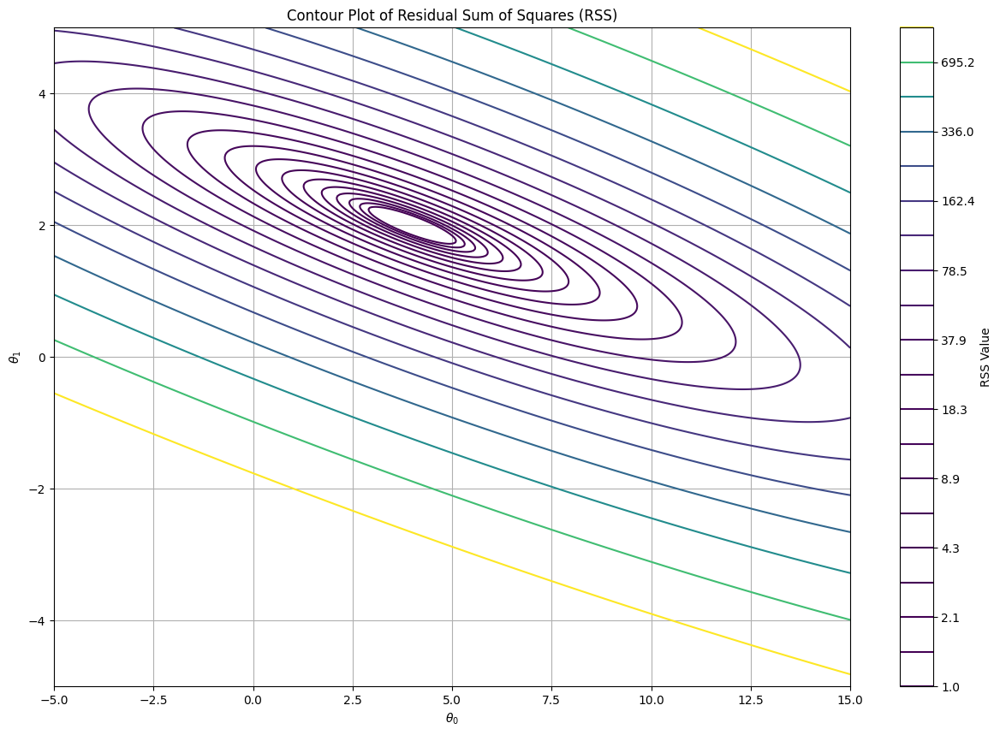

In [12]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 5
# The following question is to aid your understanding 
# of gradient descent with the help of some visualization. 
# Consider the data X and Y as given below.

# X = [1 3 6]T and Y = [6 10 16]T

# ( a.) Create a contour plot in the theta_0 and theta_1 space of residual sum of squares

# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt

# Given data
X = np.array([1, 3, 6])
Y = np.array([6, 10, 16])
m = len(Y)

# Define the RSS function
def rss(theta_0, theta_1):
    return np.sum((Y - (theta_0 + theta_1 * X))**2)

# Create a grid of theta_0 and theta_1 values
theta_0_vals = np.linspace(-5, 15, 400)
theta_1_vals = np.linspace(-5, 5, 400)
theta_0_vals, theta_1_vals = np.meshgrid(theta_0_vals, theta_1_vals)

# Compute RSS values for the grid
rss_vals = np.zeros_like(theta_0_vals)
for i in range(rss_vals.shape[0]):
    for j in range(rss_vals.shape[1]):
        rss_vals[i, j] = rss(theta_0_vals[i, j], theta_1_vals[i, j])

# Plotting the contour plot
plt.figure(figsize=(15, 10))
plt.contour(theta_0_vals, theta_1_vals, rss_vals, levels=np.logspace(0, 3, 20), cmap='viridis')
plt.xlabel(r'$\theta_0$')
plt.ylabel(r'$\theta_1$')
plt.title('Contour Plot of Residual Sum of Squares (RSS)')
plt.colorbar(label='RSS Value')
plt.grid(True)
plt.show()


<br>
<h3>
    ( b.) Create a MatPlotLib animation where the plot contains two columns: the first one being the contour plot and the second one being the linear regression fit on the data. The different frames in the animation correspond to different iterations of gradient descent applied on the dataset to learn &theta;<sub>0</sub> and &theta;<sub>1</sub>. For each iteration, draw the current value of &theta;<sub>0</sub> and &theta;<sub>1</sub> on the contour plot and also an arrow to the next &theta;<sub>0</sub> and &theta;<sub>1</sub> as learnt by gradient update rule. Correspondingly draw the y = &theta;<sub>0</sub> + &theta;<sub>1</sub>x line on the other subplot showing the scatter plot. The overall title of the plot shows the iteration number and the residual sum of squares. You are free to use any gradient descent implementation, i.e., your own or using libraries like scikit-learn.
</h3>
<br>

Animation size has reached 21031630 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.
MovieWriter imagemagick unavailable; using Pillow instead.


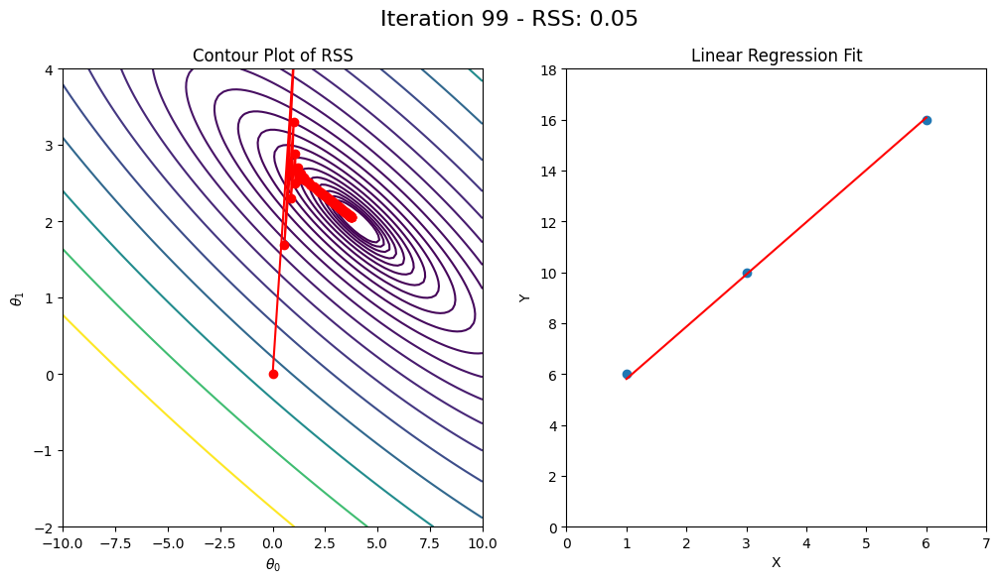

In [21]:
# Foundations of Machine Learning
# IT 582
# Student-ID : 202411012
# Name : Manish Manojkumar Prajapati

# Problem 5
# The following question is to aid your understanding 
# of gradient descent with the help of some visualization. 
# Consider the data X and Y as given below.


# X = [1 3 6]T and Y = [6 10 16]T


# ( b.) Create a MatPlotLib animation where the plot contains two columns: 
#       the first one being the contour plot and the second one being the 
#       linear regression fit on the data. The different frames in the animation 
#       correspond to different iterations of gradient descent applied on the 
#       dataset to learn θ0 and θ1. For each iteration, draw the current value of 
#       θ0 and θ1 on the contour plot and also an arrow to the next θ0 and θ1 as 
#       learnt by gradient update rule. Correspondingly draw the y = θ0 + θ1x line 
#       on the other subplot showing the scatter plot. The overall title of the plot 
#       shows the iteration number and the residual sum of squares. You are free to 
#       use any gradient descent implementation, i.e., your own or using libraries like scikit-learn.


# Importing Libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Given data
X = np.array([1, 3, 6])
Y = np.array([6, 10, 16])
m = len(Y)

# Gradient descent parameters
learning_rate = 0.1
num_iterations = 100  # Increased for better visibility

# Initialize theta
theta = np.array([0.0, 0.0])

# Gradient descent implementation
def gradient_descent_step(theta, X, Y, learning_rate):
    m = len(Y)
    predictions = theta[0] + theta[1] * X
    errors = predictions - Y
    gradient_0 = (1/m) * np.sum(errors)
    gradient_1 = (1/m) * np.sum(errors * X)
    theta[0] -= learning_rate * gradient_0
    theta[1] -= learning_rate * gradient_1
    return theta

# Residual sum of squares (RSS)
def rss(theta):
    return np.sum((Y - (theta[0] + theta[1] * X))**2)

# Gradient descent history
theta_history = [theta.copy()]
rss_history = [rss(theta)]

for _ in range(num_iterations):
    theta = gradient_descent_step(theta, X, Y, learning_rate)
    theta_history.append(theta.copy())
    rss_history.append(rss(theta))

# Prepare the animation plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Contour plot setup
theta_0_vals = np.linspace(-10, 10, 100)
theta_1_vals = np.linspace(-2, 4, 100)
theta_0_vals, theta_1_vals = np.meshgrid(theta_0_vals, theta_1_vals)
rss_vals = np.zeros_like(theta_0_vals)

for i in range(rss_vals.shape[0]):
    for j in range(rss_vals.shape[1]):
        rss_vals[i, j] = rss([theta_0_vals[i, j], theta_1_vals[i, j]])

contour = ax1.contour(theta_0_vals, theta_1_vals, rss_vals, levels=np.logspace(0, 3, 20), cmap='viridis')
theta_path, = ax1.plot([], [], 'r-o')

# Linear regression plot setup
scatter = ax2.scatter(X, Y)
line, = ax2.plot([], [], 'r-')

def init():
    ax1.set_xlabel(r'$\theta_0$')
    ax1.set_ylabel(r'$\theta_1$')
    ax1.set_title('Contour Plot of RSS')
    
    ax2.set_xlim(0, 7)
    ax2.set_ylim(0, 18)
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('Linear Regression Fit')

    return theta_path, line

def update(i):
    # Update contour plot with theta values
    theta_path.set_data([t[0] for t in theta_history[:i+1]], [t[1] for t in theta_history[:i+1]])
    
    # Update linear regression plot with current theta values
    line.set_data(X, theta_history[i][0] + theta_history[i][1] * X)
    
    # Update overall title with iteration number and RSS
    fig.suptitle(f'Iteration {i} - RSS: {rss_history[i]:.2f}', fontsize=16)
    
    return theta_path, line

# Create the animation
ani = FuncAnimation(fig, update, frames=num_iterations, init_func=init, blit=False, interval=200)

# Display the animation
# If using a Jupyter notebook, you can use this:
HTML(ani.to_jshtml())

# Save the animation as a gif (if necessary)
ani.save('gradient_descent_animation.gif', writer='imagemagick', fps=20)

# Or save as mp4
# ani.save('gradient_descent_animation.mp4', writer='ffmpeg', fps=5)
